In [1]:
import pandas as pd
import matplotlib
import numpy as np
import math
import random
import json
import shap
from IPython.display import HTML
from explanation_utils import *

from sklearn.preprocessing import MinMaxScaler
import tensorflow.keras.backend as K
import matplotlib.pyplot

In [2]:
RANDOM_STATE = 42
NSAMPLE = 1000
NBASETRAINISTANCES = 20
SVMISTANCESTOCOMPUTE = 150

pd.set_option('display.max_columns', None)
pd.set_option('max_colwidth', None)

def show_plot(plot):
    display(HTML(f"<div style='background-color:white;'>{plot.html()}</div>"))

In [3]:
# load the data
incidents_train_df = pd.read_csv('../data/clf_indicators_train.csv', index_col=0)
true_labels_train_df = pd.read_csv('../data/clf_y_train.csv', index_col=0)
true_labels_train = true_labels_train_df.values.ravel()

incidents_test_df = pd.read_csv('../data/clf_indicators_test.csv', index_col=0)
true_labels_test_df = pd.read_csv('../data/clf_y_test.csv', index_col=0)
true_labels_test = true_labels_test_df.values.ravel()

# load the names of the features
features_db = json.loads(open('../data/clf_indicators_names_distance_based.json').read())
features_rb = json.loads(open('../data/clf_indicators_names_rule_based.json').read())

# project on the used features
indicators_train_db_df = incidents_train_df[features_db]
indicators_train_rb_df = incidents_train_df[features_rb]
indicators_test_db_df = incidents_test_df[features_db]
indicators_test_rb_df = incidents_test_df[features_rb]

indicators_normalized_test_db_df = pd.read_csv('../data/clf_scaled_indicators_test.csv', index_col=0)[features_db]

selected_records_to_explain_df = pd.read_csv('../data/explanation_results/selected_records_to_explain.csv', index_col=0)
random_records_to_explain_df = pd.read_csv('../data/explanation_results/random_records_to_explain.csv', index_col=0)
preds = get_classifiers_predictions('../data/classification_results/')
classifiers = get_classifiers_objects('../data/classification_results/')

clf_names = [clf.value for clf in Classifiers]
rb_clf_names = [Classifiers.DT.value, Classifiers.RF.value, Classifiers.XGB.value]
db_clf_names = [Classifiers.NN.value, Classifiers.SVM.value]

# features to analyze
features_to_explore = [
    'date', 'day_of_week', 'days_from_first_incident',
    'state', 'address', 'city',  'min_age', 'max_age',
    'n_child', 'n_teen', 'n_adult', 'n_males', 'n_females',
    'n_killed', 'n_injured', 'n_arrested', 'n_unharmed', 
    'n_participants', 'notes', 'incident_characteristics1',
    'incident_characteristics2', 'democrat', 'poverty_perc',
    'gun_law_rank', 'aggression', 'accidental', 'defensive',
    'suicide', 'road', 'house', 'school', 'business',
    'illegal_holding', 'drug_alcohol', 'officers',
    'organized', 'social_reasons', 'abduction'
]




DecisionTreeClassifier
KNearestNeighborsClassifier
NearestCentroidClassifier
RandomForestClassifier
NaiveBayesMixedClassifier
SupportVectorMachineClassifier


Trying to unpickle estimator DecisionTreeClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator KNeighborsClassifier from version 1.3.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator NearestCentroid from version 1.3.1 when using version 1.3.2. This might lead to breaking code or invalid results. Use at your own risk. For more info please refer to:
https://scikit-learn.org/stable/model_persistence.html#security-maintainability-limitations
Trying to unpickle estimator RandomForestClassifier from version 1.3.0 when using version 1.3.2. This might lead to breaking

ExtremeGradientBoostingClassifier


In [4]:
indicators_train_db_df_samples = indicators_train_db_df.sample(NSAMPLE, random_state=RANDOM_STATE)#indicators_train_db_df.iloc[samples_indices_train]
indicators_train_rb_df_samples = indicators_train_rb_df.loc[indicators_train_db_df_samples.index]#.sample(NSAMPLE, random_state=RANDOM_STATE)
indicators_test_db_df_samples = indicators_test_db_df.sample(NSAMPLE - selected_records_to_explain_df.shape[0] - random_records_to_explain_df.shape[0], random_state=RANDOM_STATE)
indicators_test_rb_df_samples = indicators_test_rb_df.loc[indicators_test_db_df_samples.index]#.sample(NSAMPLE - selected_records_to_explain_df.shape[0], random_state=RANDOM_STATE)

#indicators_normalized_test_db_df_samples = incidents_normalized_test_df.loc[indicators_test_db_df_samples.index]#.sample(NSAMPLE - selected_records_to_explain_df.shape[0], random_state=RANDOM_STATE)


#adding the istances to explain
indicators_test_db_df_samples = pd.concat([indicators_test_db_df_samples, 
                                            indicators_test_db_df.iloc[random_records_to_explain_df['positions'].values]])
                                            
indicators_test_rb_df_samples = pd.concat([indicators_test_rb_df_samples, 
                                            indicators_test_rb_df.iloc[random_records_to_explain_df['positions'].values]])


indicators_test_db_df_samples = pd.concat([indicators_test_db_df_samples, 
                                            indicators_test_db_df.iloc[selected_records_to_explain_df['positions'].values]])
                                            
indicators_test_rb_df_samples = pd.concat([indicators_test_rb_df_samples, 
                                            indicators_test_rb_df.iloc[selected_records_to_explain_df['positions'].values]])

#indicators_normalized_test_db_df_samples = pd.concat([indicators_normalized_test_db_df_samples, 
#                                            incidents_normalized_test_df.iloc[selected_records_to_explain_df['positions'].values]])

ATTEMPTED_SUICIDE_OFFSET = -selected_records_to_explain_df.shape[0]
MASS_SHOOTING_OFFSET = -selected_records_to_explain_df.shape[0] + 1
RANDOM_RECORDS_OFFSET = ATTEMPTED_SUICIDE_OFFSET - random_records_to_explain_df.shape[0]

In [37]:
indicators_test_db_df_samples.tail(16)

,location_imp,x,y,age_range,avg_age,n_child_prop,n_teen_prop,n_males_prop,n_participants,day_x,day_y,day_of_week_x,day_of_week_y,month_x,month_y,year,days_from_first_incident,poverty_perc,democrat,gun_law_rank,aggression,accidental,defensive,suicide,road,house,school,business,illegal_holding,drug_alcohol,officers,organized,social_reasons,abduction
178231,1.000000e-07,6.498082e+05,2.866782e+06,0.0,37.0,0.000000,0.0,1.000000,1.0,-5.712682e-01,0.820763,0.433884,-0.900969,8.660254e-01,-5.000000e-01,2016.0,1213,13.7,1.0,13.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
16951,3.063015e-01,2.298900e+06,3.793572e+06,66.0,52.0,0.000000,0.0,0.400000,10.0,-2.993631e-01,-0.954139,0.974928,-0.222521,1.224647e-16,-1.000000e+00,2015.0,897,14.6,0.0,13.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
90302,1.000000e-05,-8.995619e+05,4.979798e+06,0.0,19.0,0.000000,0.0,1.000000,1.0,9.377521e-01,0.347305,-0.781831,0.623490,-8.660254e-01,-5.000000e-01,2017.0,1678,10.0,0.0,13.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
16951,3.063015e-01,2.298900e+06,3.793572e+06,66.0,52.0,0.000000,0.0,0.400000,10.0,-2.993631e-01,-0.954139,0.974928,-0.222521,1.224647e-16,-1.000000e+00,2015.0,897,14.6,0.0,13.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
128474,1.000000e-07,1.141124e+06,3.802027e+06,4.0,66.0,0.000000,0.0,0.500000,2.0,9.884683e-01,0.151428,0.781831,0.623490,-8.660254e-01,5.000000e-01,2014.0,644,16.8,0.0,13.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
220730,1.000100e-01,-6.326315e+06,3.706255e+06,0.0,62.0,0.000000,0.0,0.000000,1.0,-2.449294e-16,1.000000,0.433884,-0.900969,1.000000e+00,6.123234e-17,2016.0,1185,9.5,1.0,3.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
18953,1.000100e-01,-3.857060e+05,3.976536e+06,0.0,70.0,0.000000,0.0,0.500000,2.0,-7.247928e-01,0.688967,0.433884,-0.900969,8.660254e-01,-5.000000e-01,2017.0,1577,17.2,1.0,13.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
201594,1.000000e-07,6.220431e+05,2.900501e+06,24.0,21.0,0.058824,0.0,0.941176,17.0,4.853020e-01,-0.874347,0.974928,-0.222521,5.000000e-01,-8.660254e-01,2015.0,862,14.0,1.0,13.0,0,0,0,0,0,0,0,0,0,0,0,0,0,0
52062,1.000000e-07,8.931259e+05,4.332844e+06,9.0,76.0,0.000000,0.0,0.500000,2.0,7.907757e-01,-0.612106,-0.781831,0.623490,1.000000e+00,6.123234e-17,2018.0,1895,10.8,1.0,13.0,0,0,0,1,0,0,0,0,0,0,0,0,0,0
166734,1.000000e-07,2.440020e+06,4.593152e+06,0.0,18.0,0.000000,0.0,1.000000,1.0,9.884683e-01,0.151428,0.974928,-0.222521,1.000000e+00,6.123234e-17,2018.0,1891,8.1,1.0,3.0,0,0,0,0,0,0,0,0,1,0,1,0,0,0


# Global explanation

SHAP (SHapley Additive exPlanations) values are a technique used in machine learning to explain the output of a model for individual predictions. They offer insights into how each feature contributes to the prediction made by the model.

SHAP values breackdown:

1. Interpreting Black Box Models:
Many advanced machine learning models, like gradient boosting machines or neural networks, are considered "black box" models because they don't provide clear explanations for their predictions.
SHAP values aim to interpret these complex models by attributing the prediction difference from a baseline to different input features.
2. Feature Importance:
SHAP values assign an importance score to each feature for a particular prediction.
These scores illustrate how much each feature contributes to the final prediction compared to a baseline prediction (usually the average output of the model).
3. Consistency and Interpretability:
SHAP values ensure consistency. If a feature's value increases and the SHAP value for that feature is positive, it means the prediction is more likely to increase as well.
They maintain interpretability by providing a clear understanding of the impact each feature has on individual predictions.
4. Calculation using Shapley Values from Game Theory:
SHAP values are based on Shapley values from cooperative game theory. They calculate the contribution of each feature by considering its impact when combined with different subsets of other features.
5. Visualization:
They can be visualized using summary plots like SHAP summary plots or individual prediction force plots, which display the contribution of each feature to an individual prediction.
6. Usage:
SHAP values have diverse applications, from understanding model predictions to feature selection, model debugging, and building trust in AI systems.

In [5]:
explainers = {}
shap_values = {}
shap_interaction_values = {}
shap.initjs()
minmax_scaler = MinMaxScaler().fit(indicators_train_db_df.values) # the explainer remove the feature names

## Decision Tree

In [6]:
explainers[Classifiers.DT.value] = shap.TreeExplainer(classifiers[Classifiers.DT.value])
shap_values[Classifiers.DT.value] = explainers[Classifiers.DT.value].shap_values(indicators_test_rb_df_samples)

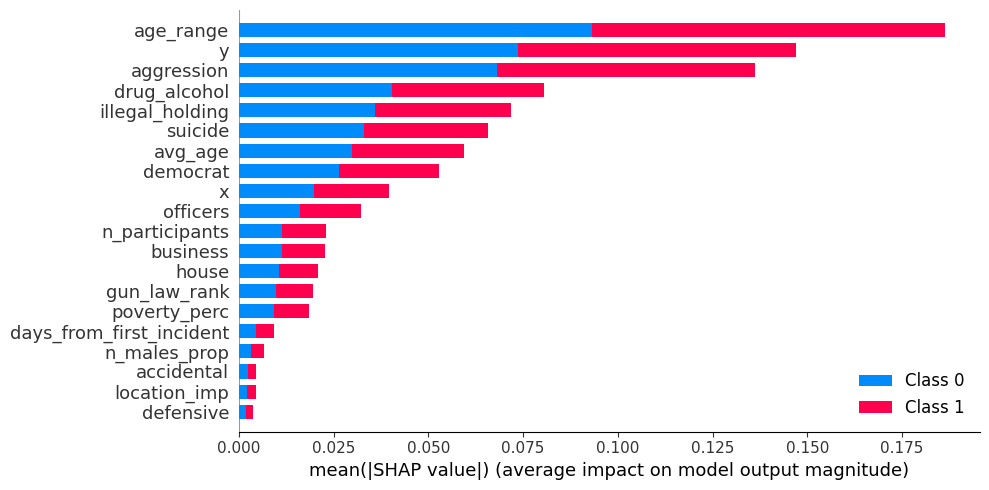

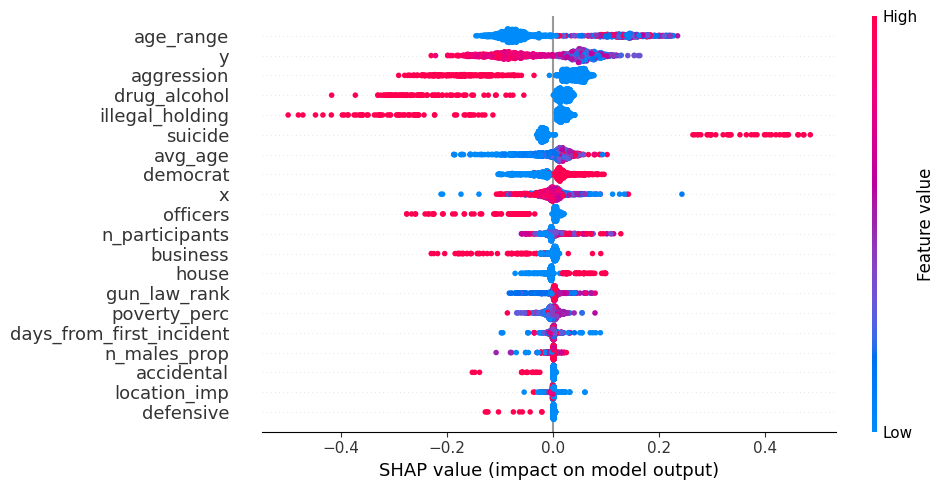

In [40]:
shap.summary_plot(shap_values[Classifiers.DT.value], indicators_test_rb_df_samples,plot_size=(10,5))
shap.summary_plot(shap_values[Classifiers.DT.value][1], indicators_test_rb_df_samples,plot_size=(10,5))
# in classificazione binaria le altezze delle barre sono uguali
# alto abs(shap) => grande importanza

# dal secondo grafico si capisce che aggression, hillegal holding, suicide ecc sono molto divise in come
# influiscono nel risultato

In [41]:
'''shap.dependence_plot(
    ("age_range", "aggression"),
    shap_interaction_values[Classifiers.DT.value][1], indicators_test_rb_df_samples
)'''# TODO: capire cosa sono i valori interaction??

'shap.dependence_plot(\n    ("age_range", "aggression"),\n    shap_interaction_values[Classifiers.DT.value][1], indicators_test_rb_df_samples\n)'

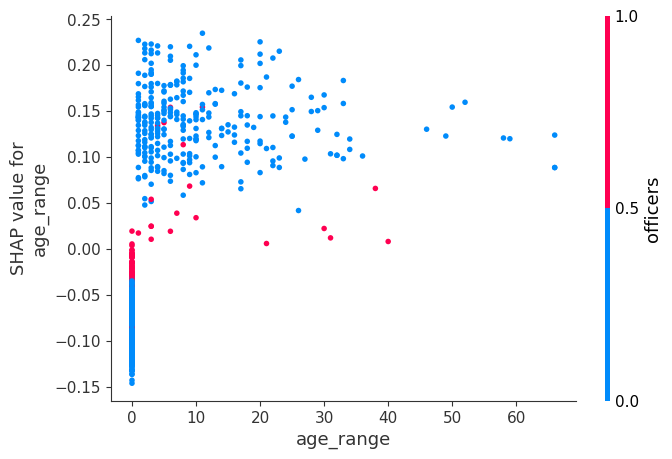

In [42]:
shap.dependence_plot("age_range", shap_values[Classifiers.DT.value][1], indicators_test_rb_df_samples)
# age_range alta -> morte!!

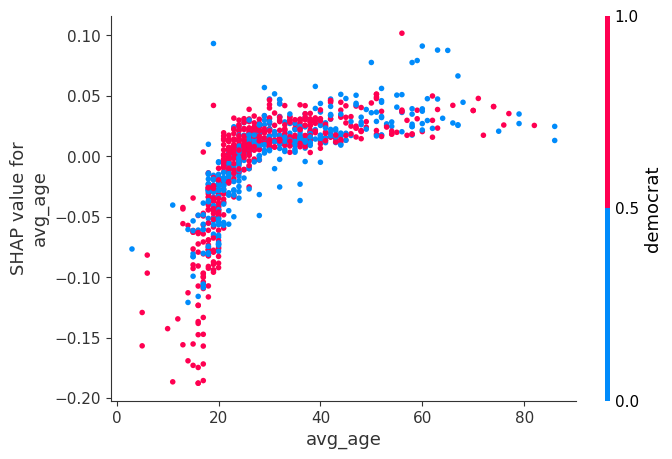

In [43]:
shap.dependence_plot("avg_age", shap_values[Classifiers.DT.value][1], indicators_test_rb_df_samples) # Fatal (shap_values_tree[0] is symmetric, only the sign changes)
# democrat è la feature che interagisce di più con avg_age
# età>60 => fatale
# età<20 => non fatale
# sotto i 20 anni lo shap value cambia tra -0.2 e 0.05, dunque dipende da altre features (quella da cui dipende di più è democrat)
# quando è nagativo lo stato è democratico => in stati democratici la mortalità in giovani è minore

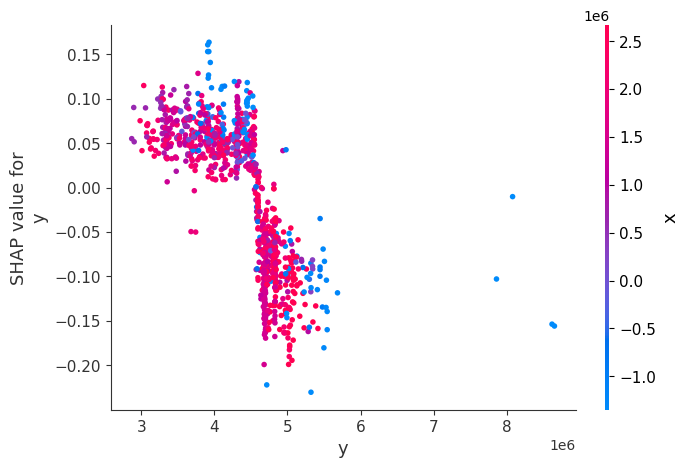

In [44]:
shap.dependence_plot("y", shap_values[Classifiers.DT.value][1], indicators_test_rb_df_samples)
#da commentare perchè è molto strana come relazione(posizione fatalità) ??

In [45]:
shap_interaction_values[Classifiers.DT.value] = explainers[Classifiers.DT.value].shap_interaction_values(indicators_test_rb_df_samples)

In [46]:
#shap.summary_plot(shap_interaction_values[Classifiers.DT.value][1], indicators_test_rb_df_samples, max_display=31) # Fatal
# il colore è il valore assunto dalla feature sulle righe (road, school, etc sono per lp più blu sulle righe)
# la posizione lungo y non ha una scala, mostra solo quanti punti ci sono
# interaction value negativo => 

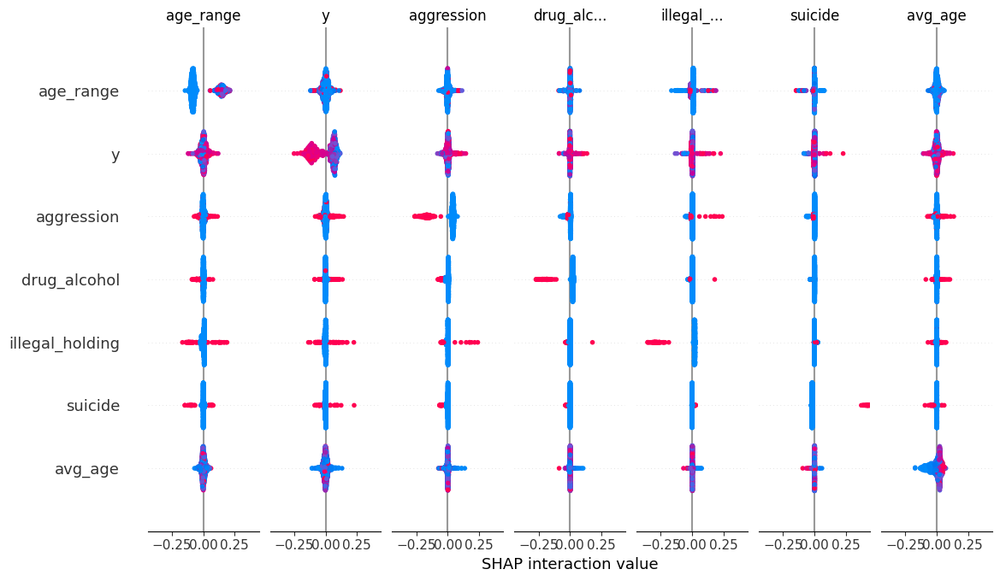

In [47]:
shap.summary_plot(shap_interaction_values[Classifiers.DT.value][1], indicators_test_rb_df_samples, max_display=7)
# età-eta
# tanti punti con interazione negativa; il valore dell'età è basso (blu)
# aggression-age

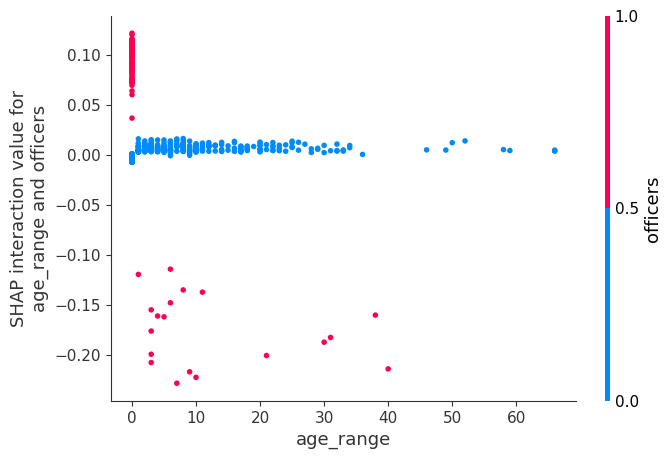

In [48]:
shap.dependence_plot(
    ("age_range", "officers"),
    shap_interaction_values[Classifiers.DT.value][1], indicators_test_rb_df_samples
)
# quando non c'è aggressione, avg age assume un po' tutti i valori e non c'è interazione
# sotto i 30 anni l'interazione è sia positiva che negativa
# sopra i 40 anni l'interazione è nulla o negativa
# punti in cui l'età è 20 e aggression 1 hanno interazioni positiva e nagativa?

# Grafico fico, se si riesce a spiegare sarebbe anche meglio
# relaione con il primo dependency_plot

In [49]:
force_plot = shap.force_plot(shap.TreeExplainer(classifiers[Classifiers.DT.value]).expected_value[1], shap_values[Classifiers.DT.value][1], indicators_test_rb_df_samples)
show = show_plot(force_plot)
# gli esempi sono ordinati su asse x
# le feature blue determinerebbero non mortale, rosse mortale
# tanti force plot locali stacked verticalmente
# TODO:
# f(x) è il valore predetto dal modello

## Random Forest

In [7]:
explainers[Classifiers.RF.value] = shap.TreeExplainer(classifiers[Classifiers.RF.value])
shap_values[Classifiers.RF.value] = explainers[Classifiers.RF.value].shap_values(indicators_test_rb_df_samples)

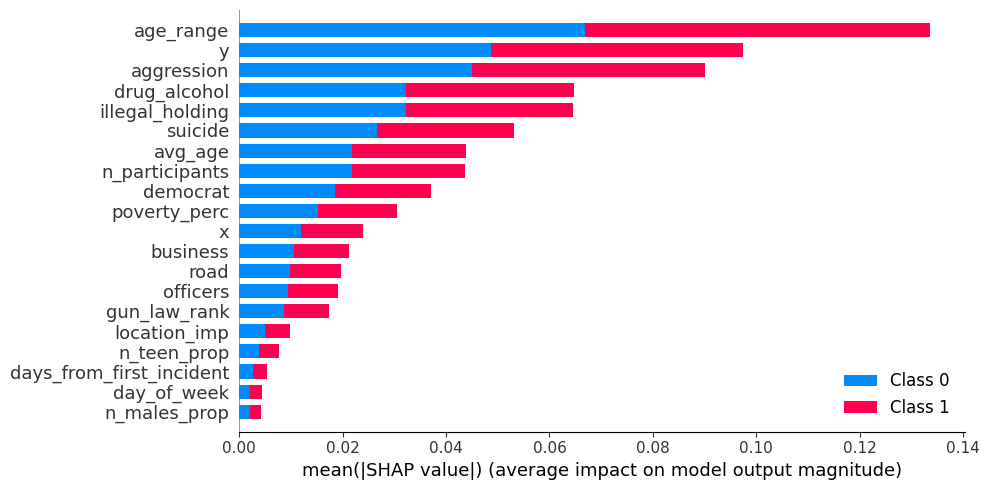

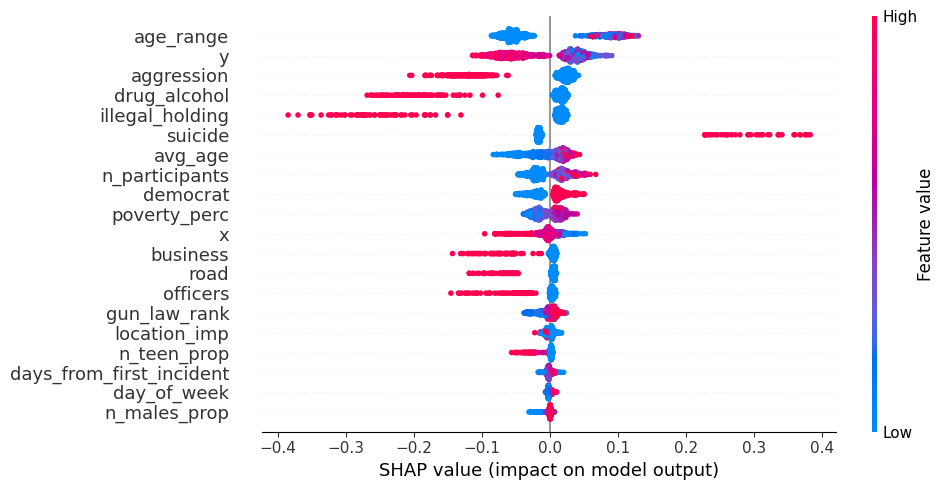

In [51]:
shap.summary_plot(shap_values[Classifiers.RF.value], indicators_test_rb_df_samples,plot_size=(10,5))
shap.summary_plot(shap_values[Classifiers.RF.value][1], indicators_test_rb_df_samples,plot_size=(10,5))
# in classificazione binaria le altezze delle barre sono uguali
# alto abs(shap) => grande importanza

It can be seen from the graph, the features assault, illegal possession, and drug-alcohol, how positive they are, negatively affect the result of the classifier, and vice versa. Probably because these 3 tags already identify a type of incident, without requiring the presence of fatalities

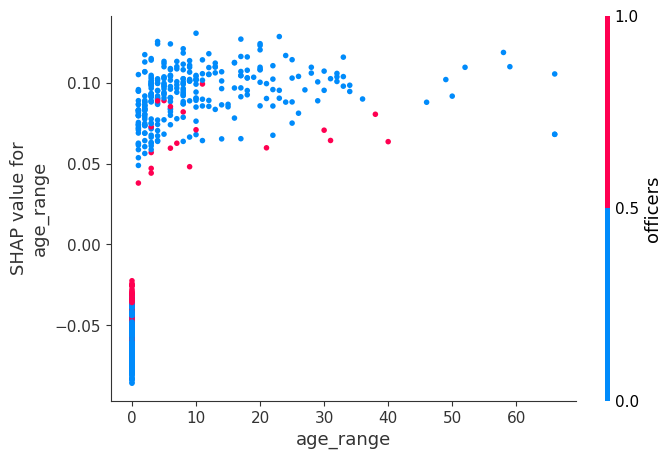

In [52]:
shap.dependence_plot("age_range", shap_values[Classifiers.RF.value][1], indicators_test_rb_df_samples)
# simile a prima

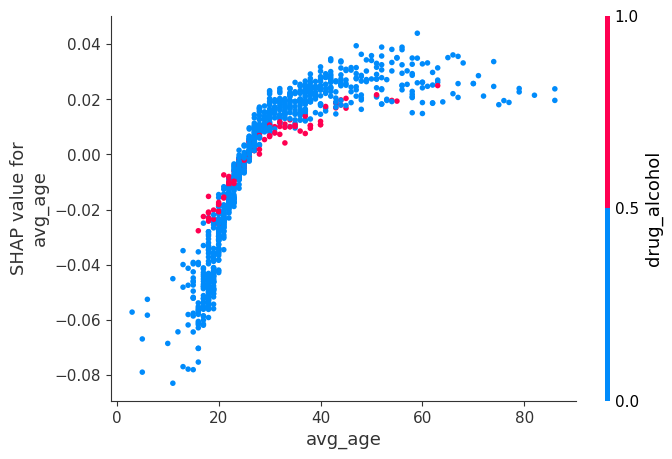

In [53]:
shap.dependence_plot("avg_age", shap_values[Classifiers.RF.value][1], indicators_test_rb_df_samples)
# smile a prima, ma interessante correlazione con drug alcohol (se presente riduce la rilevanza di avg_age)

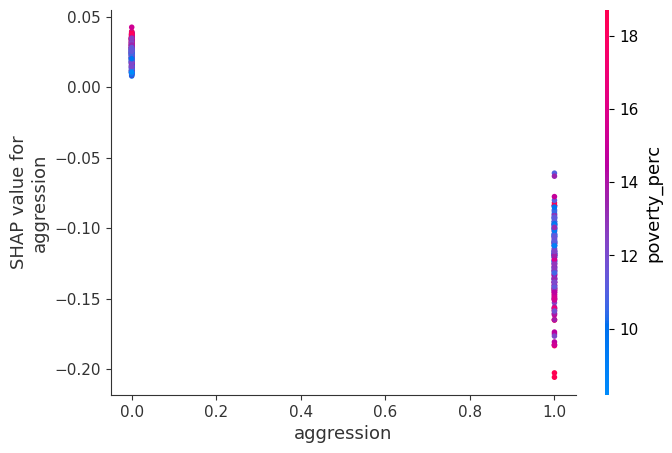

In [54]:
shap.dependence_plot("aggression", shap_values[Classifiers.RF.value][1], indicators_test_rb_df_samples)
# esempio di una features che: 
# se True -> shap negativo (molto più negativo che positivo)
# se False -> shap positivo

In [55]:
shap_interaction_values[Classifiers.RF.value] = explainers[Classifiers.RF.value].shap_interaction_values(indicators_test_rb_df_samples)
#Per tutto il dataset in 83 minuti non aveva terminato...

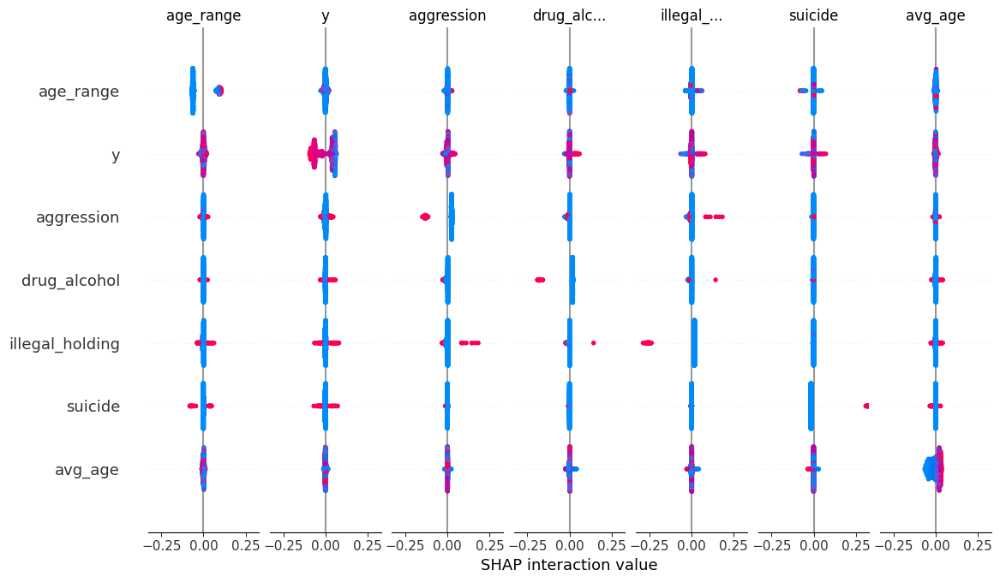

In [ ]:
shap.summary_plot(shap_interaction_values[Classifiers.RF.value][1], indicators_test_rb_df_samples, max_display=7)
# grafico incomprensibile??

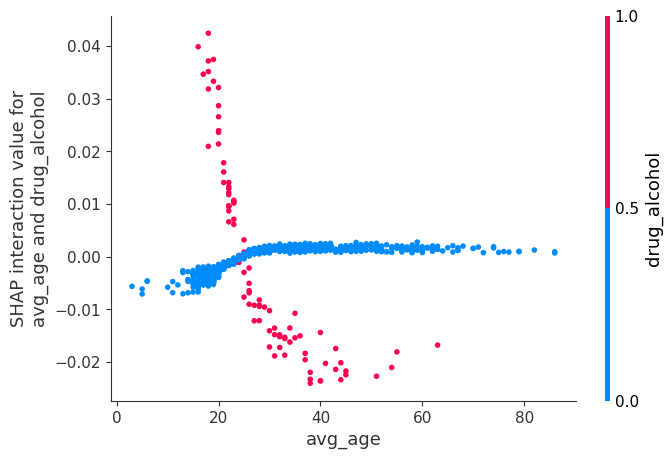

In [ ]:
shap.dependence_plot(
    ("avg_age", "drug_alcohol"),
    shap_interaction_values[Classifiers.RF.value][1], indicators_test_rb_df_samples
)

# Grafico fico, se si riesce a spiegare sarebbe anche meglio

In [ ]:
shap.initjs()
force_plot = shap.force_plot(explainers[Classifiers.RF.value].expected_value[1], shap_values[Classifiers.RF.value][1], indicators_test_rb_df_samples)
show = show_plot(force_plot)

## Extreme Gradient Boosting

In [8]:
explainers[Classifiers.XGB.value] = shap.TreeExplainer(classifiers[Classifiers.XGB.value])
shap_values[Classifiers.XGB.value] = explainers[Classifiers.XGB.value].shap_values(indicators_test_rb_df_samples)

[12:44:37] WARNING: C:\buildkite-agent\builds\buildkite-windows-cpu-autoscaling-group-i-0b3782d1791676daf-1\xgboost\xgboost-ci-windows\src\c_api\c_api.cc:1240: Saving into deprecated binary model format, please consider using `json` or `ubj`. Model format will default to JSON in XGBoost 2.2 if not specified.


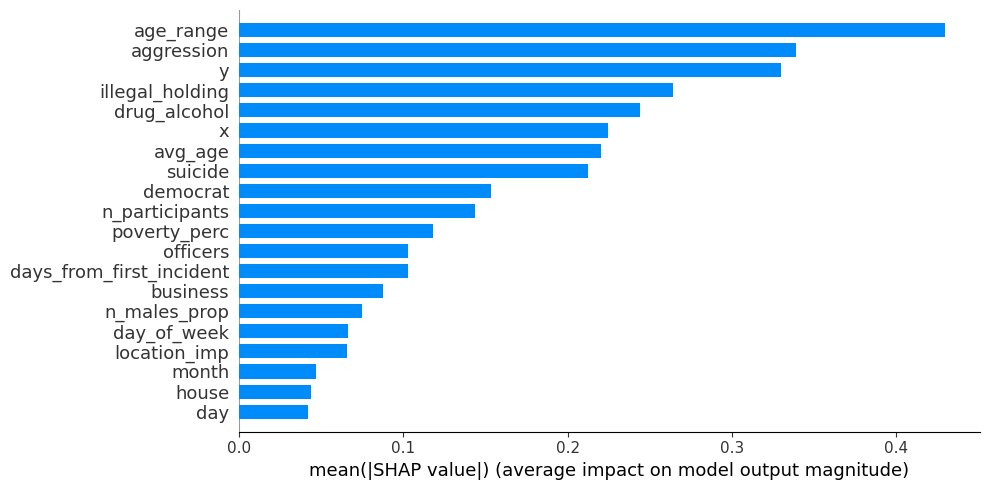

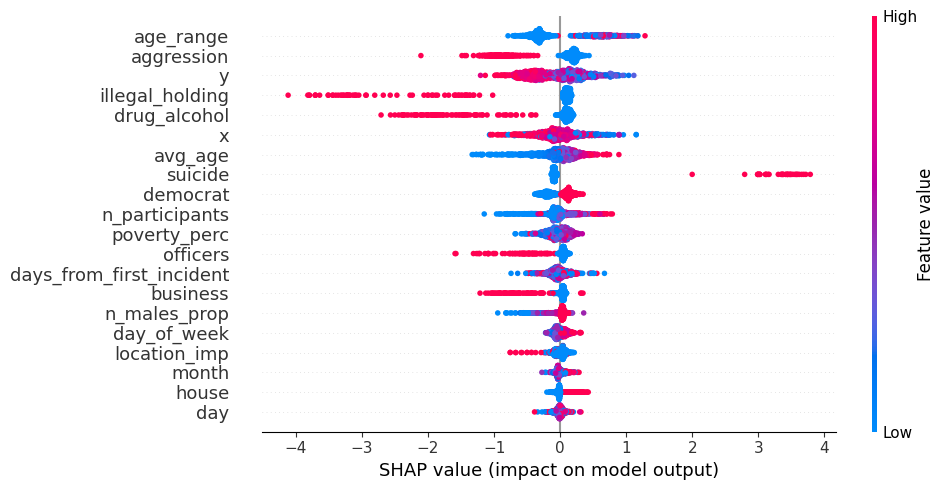

In [ ]:
# Classificatore Più efficace!!!
shap.summary_plot(shap_values[Classifiers.XGB.value], indicators_test_rb_df_samples,plot_size=(10,5), plot_type="bar")
shap.summary_plot(shap_values[Classifiers.XGB.value], indicators_test_rb_df_samples,plot_size=(10,5))
# in classificazione binaria le altezze delle barre sono uguali
# alto abs(shap) => grande importanza

# gun_law_rank sparito???

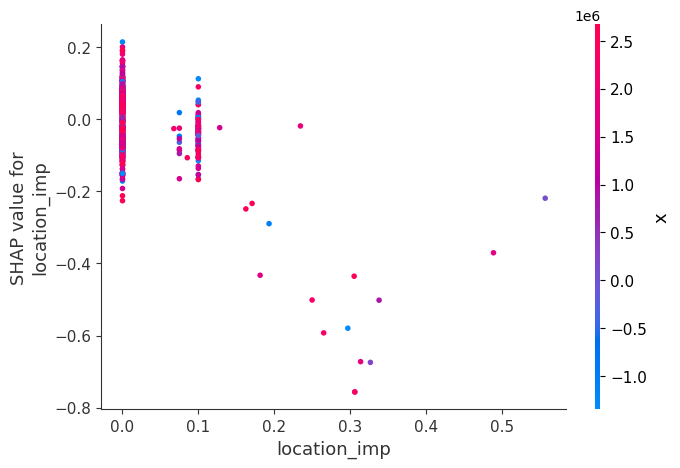

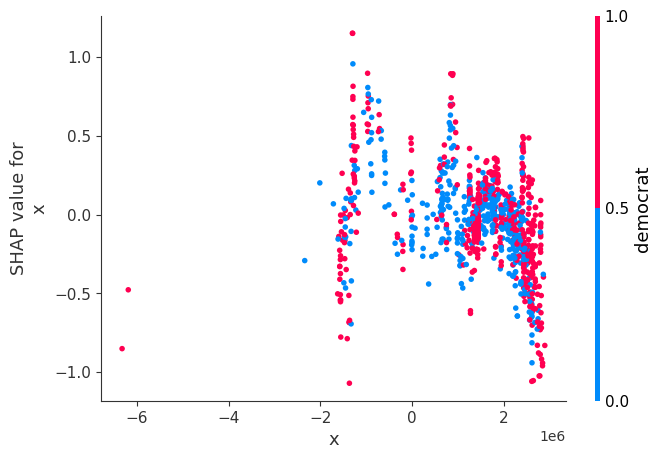

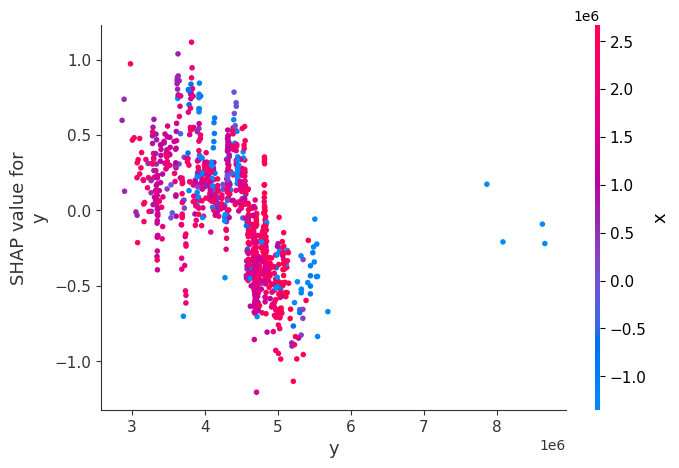

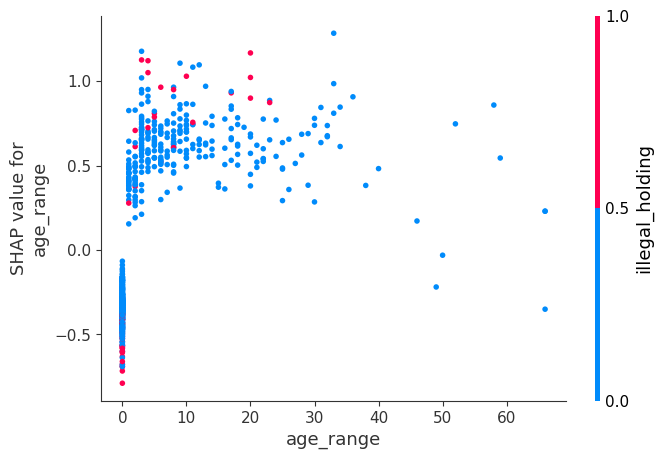

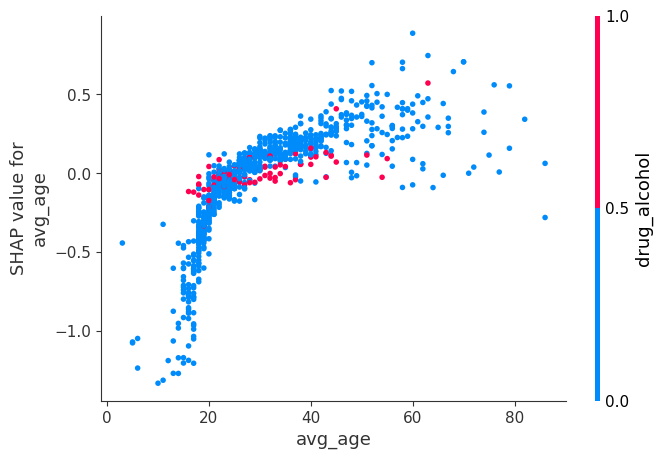

...

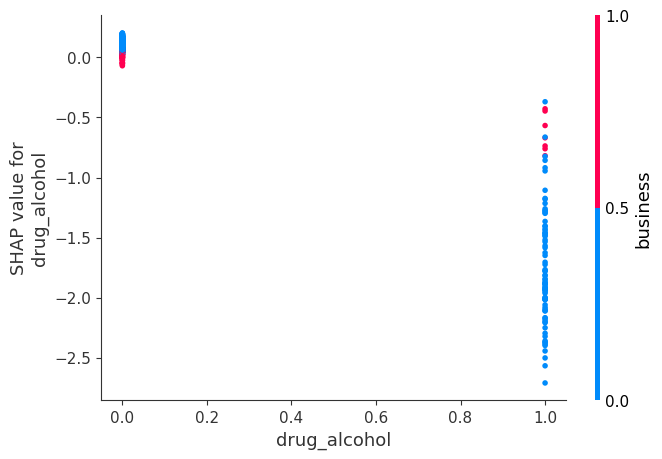

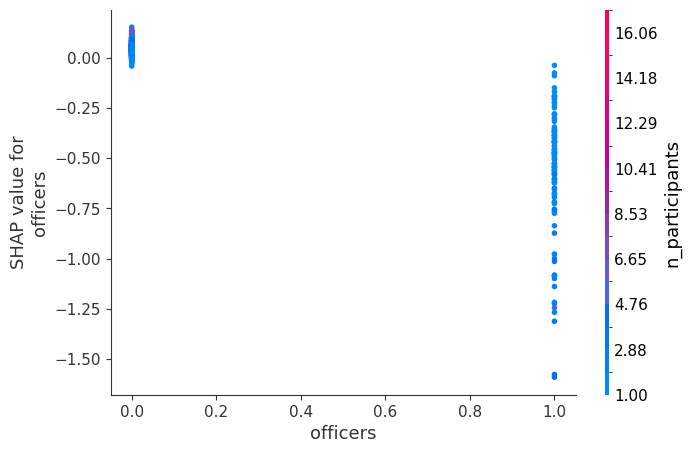

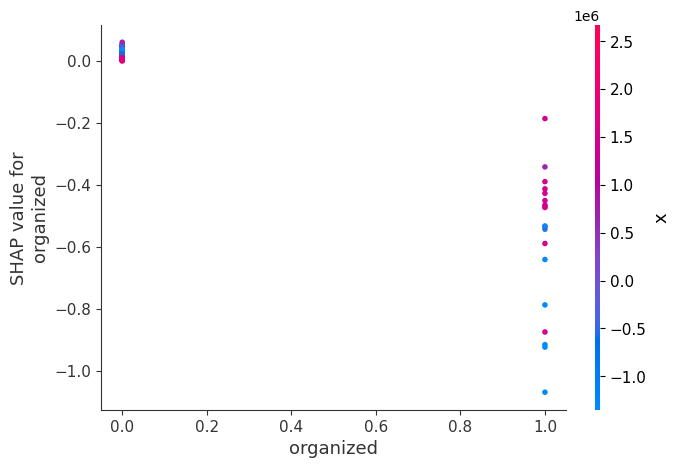

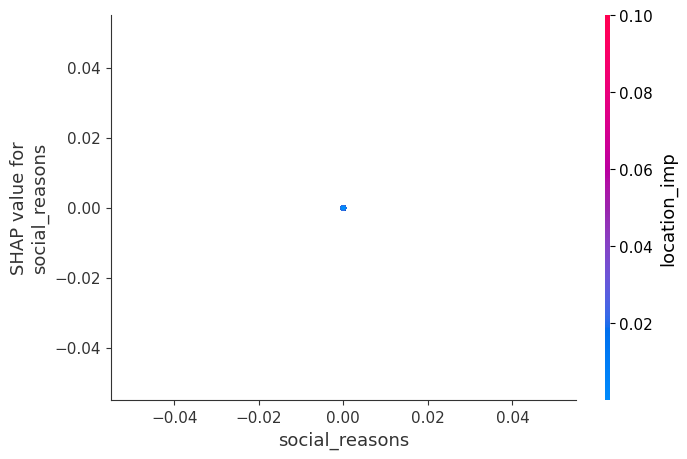

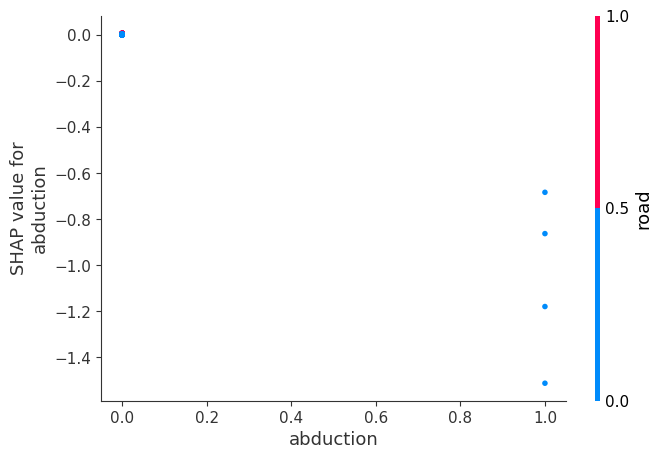

In [ ]:
for col in indicators_test_rb_df_samples.columns:
    shap.dependence_plot(col, shap_values[Classifiers.XGB.value], indicators_test_rb_df_samples)

In [ ]:
force_plot = shap.force_plot(explainers[Classifiers.XGB.value].expected_value, shap_values[Classifiers.XGB.value], indicators_test_rb_df_samples)
show = show_plot(force_plot)

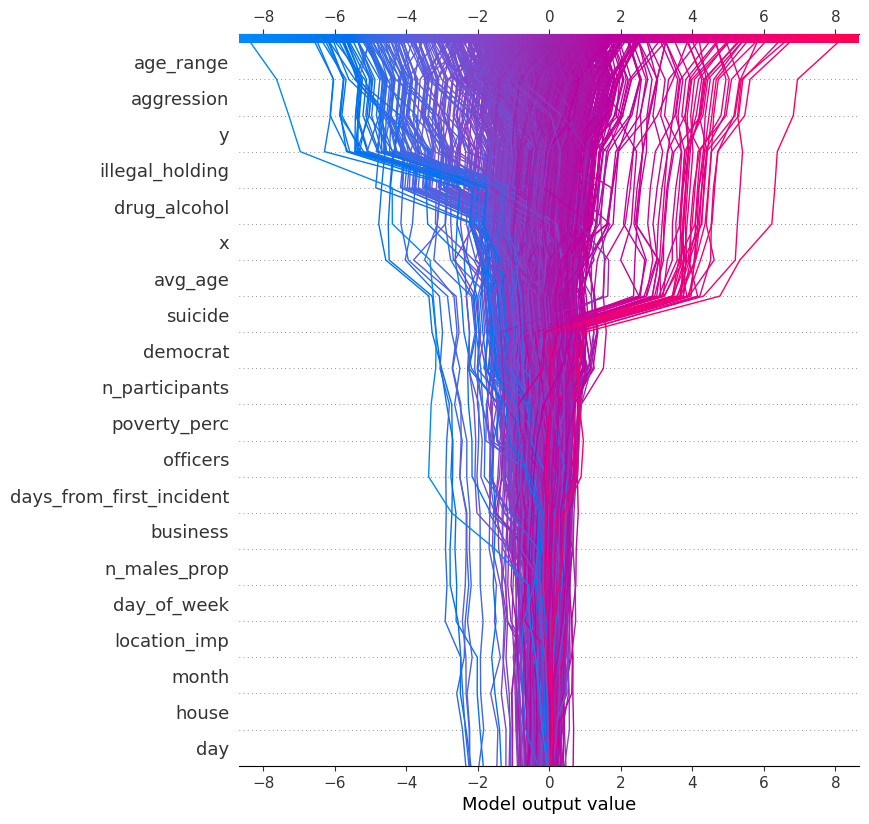

In [ ]:
shap.decision_plot(explainers[Classifiers.XGB.value].expected_value, 
                shap_values[Classifiers.XGB.value], 
                indicators_test_rb_df_samples.columns)

# potenzialmente da togliere

## Feed Forward Neural Network

In [9]:
def f_nn(X):
    X = minmax_scaler.transform(X)
    X = K.constant(X)
    return classifiers[Classifiers.NN.value].predict(X).flatten()

In [10]:
#np.seterr(divide = 'ignore') # ignore the log10 divizion for 0 warning
explainers[Classifiers.NN.value] = shap.KernelExplainer(f_nn , indicators_train_db_df_samples.sample(NBASETRAINISTANCES, random_state=RANDOM_STATE), seed=RANDOM_STATE)
shap_values[Classifiers.NN.value] = explainers[Classifiers.NN.value].shap_values(indicators_test_db_df_samples)
#np.seterr(divide = 'warn') 

1/1 [==============================] - 0s 164ms/step


  0%|          | 0/1000 [00:00<?, ?it/s]

1317/1317 [==============================] - 2s 1ms/step


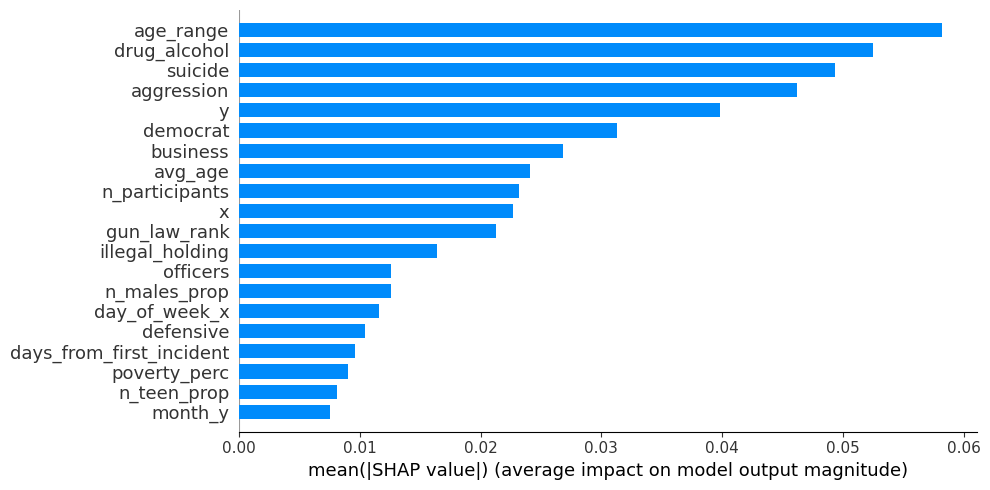

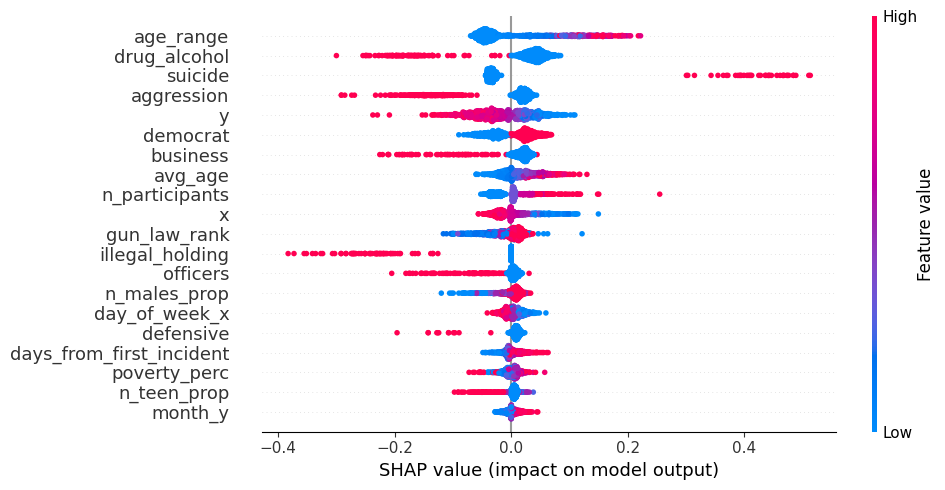

In [ ]:
shap.summary_plot(shap_values[Classifiers.NN.value], indicators_test_db_df_samples ,plot_size=(10,5), plot_type='bar')
shap.summary_plot(shap_values[Classifiers.NN.value], indicators_test_db_df_samples ,plot_size=(10,5))
# in classificazione binaria le altezze delle barre sono uguali
# alto abs(shap) => grande importanza

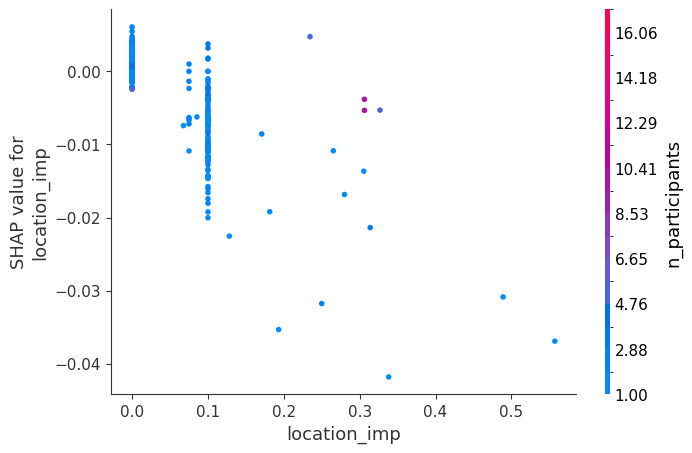

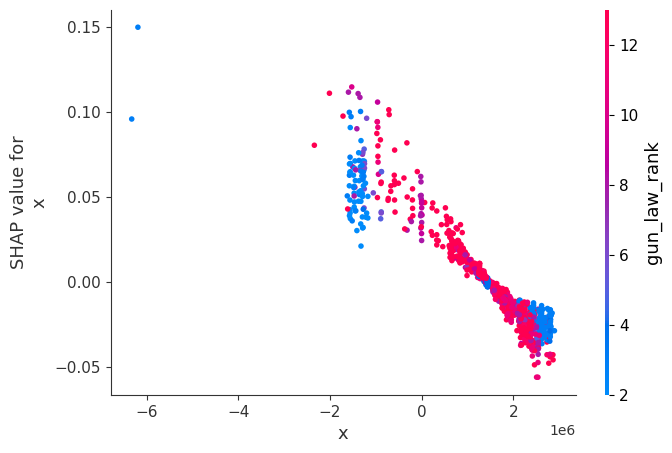

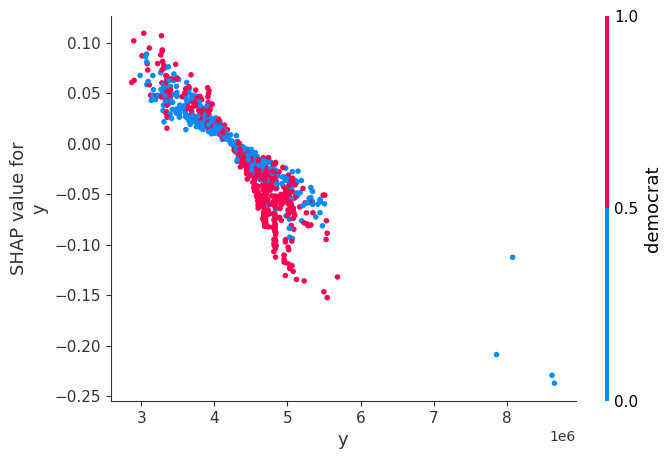

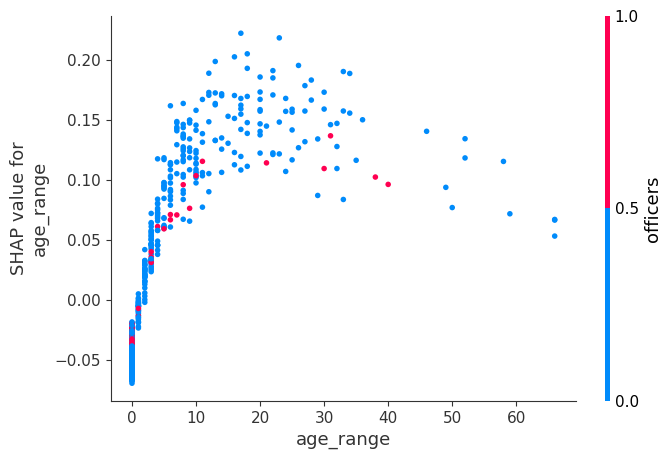

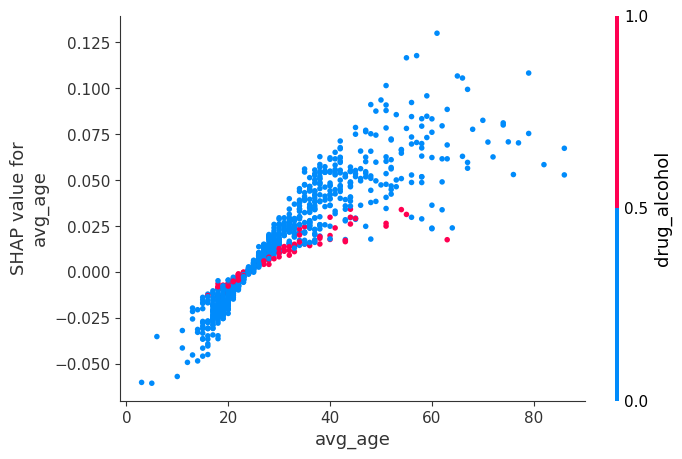

...

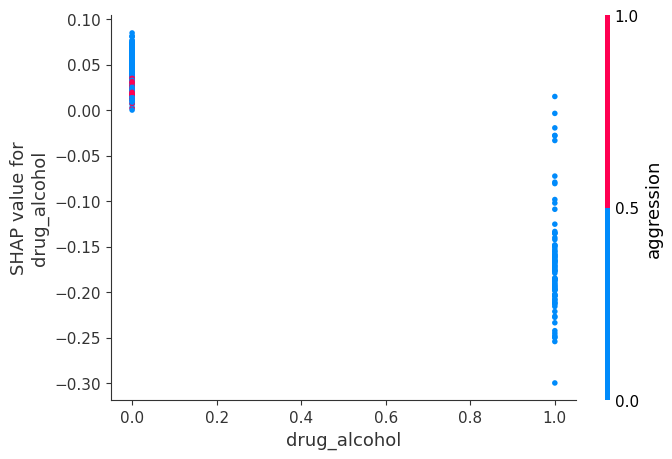

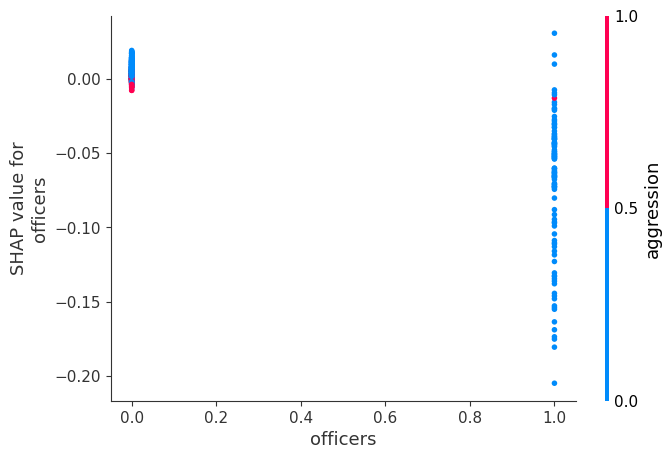

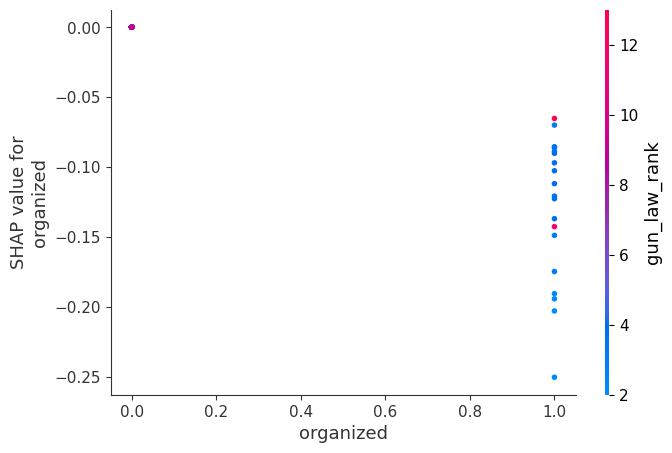

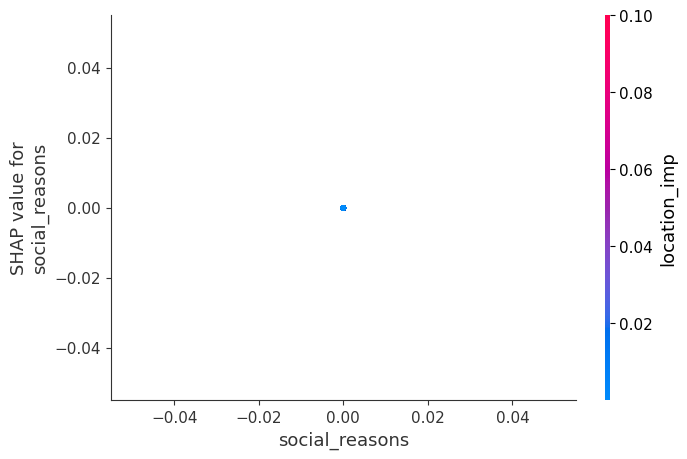

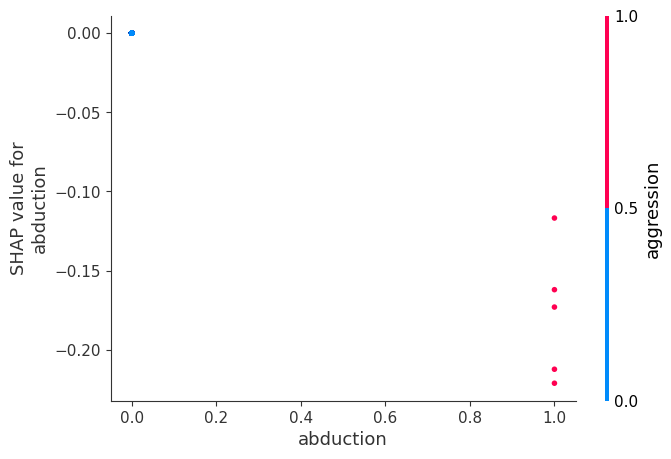

In [ ]:
for col in indicators_test_db_df_samples.columns:
    shap.dependence_plot(col, shap_values[Classifiers.NN.value], indicators_test_db_df_samples)
# per essere sicuro ho fatto tutti i grarfici

In [ ]:
force_plot = shap.force_plot(explainers[Classifiers.NN.value].expected_value, shap_values[Classifiers.NN.value], indicators_test_db_df_samples)
show = show_plot(force_plot)

## Support Vector Machine

In [ ]:
# NON USARE PER PREDIZIONI GLOBALI PERCHé é FATTO CON MOLTI MENO PUNTI DEGLI ALTRI PERCHé é LENTO

In [11]:
def f_svm(X):
    X = minmax_scaler.transform(X)
    return np.array([x[1] for x in classifiers[Classifiers.SVM.value].predict_proba(X)])

In [12]:
explainers[Classifiers.SVM.value] = shap.KernelExplainer(f_svm , 
                                                         indicators_train_db_df_samples.sample(math.ceil(NBASETRAINISTANCES/5), random_state=RANDOM_STATE), 
                                                         seed=RANDOM_STATE)
#explainers[Classifiers.SVM.value] = shap.KernelExplainer(f_svm , indicators_train_db_df_samples.sample(4, random_state=RANDOM_STATE), seed=RANDOM_STATE)
shap_values[Classifiers.SVM.value] = explainers[Classifiers.SVM.value].shap_values(indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:])

  0%|          | 0/150 [00:00<?, ?it/s]

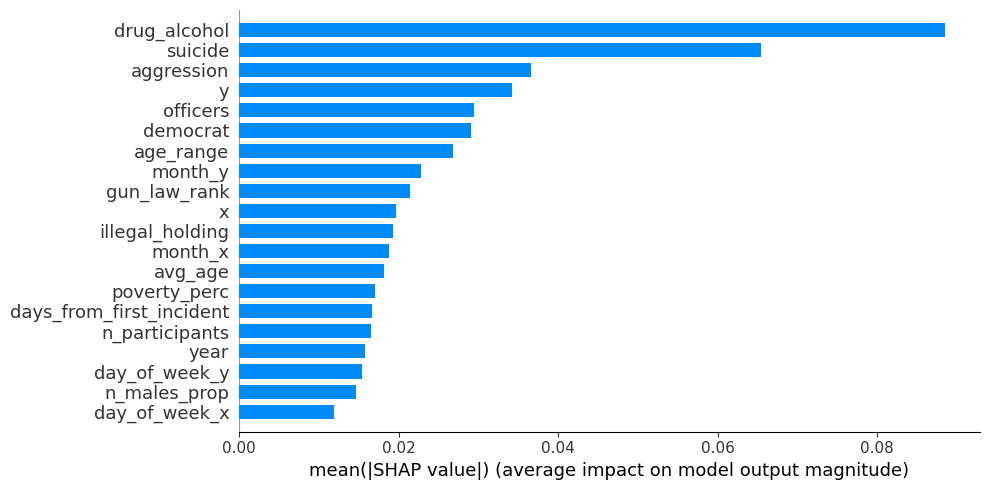

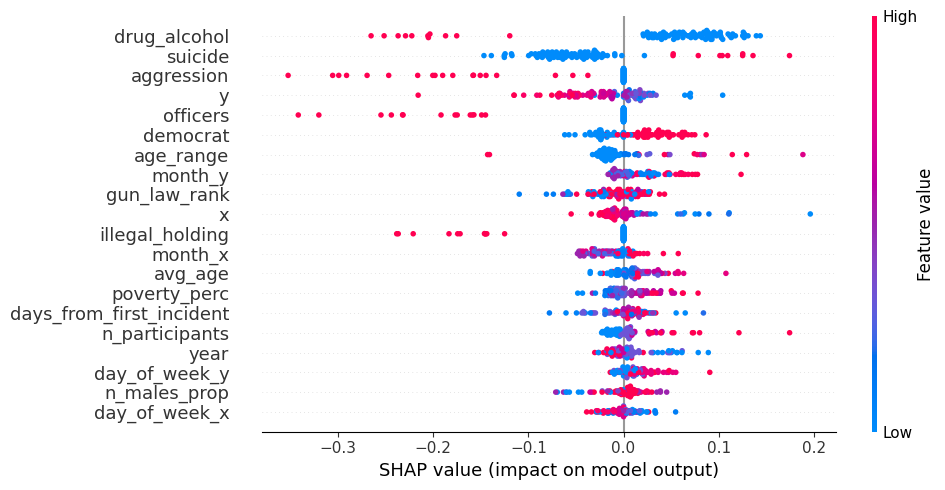

In [ ]:
shap.summary_plot(shap_values[Classifiers.SVM.value], indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:] ,plot_size=(10,5), plot_type='bar')
shap.summary_plot(shap_values[Classifiers.SVM.value], indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:] ,plot_size=(10,5))
# TODO: strano ordine d attributi

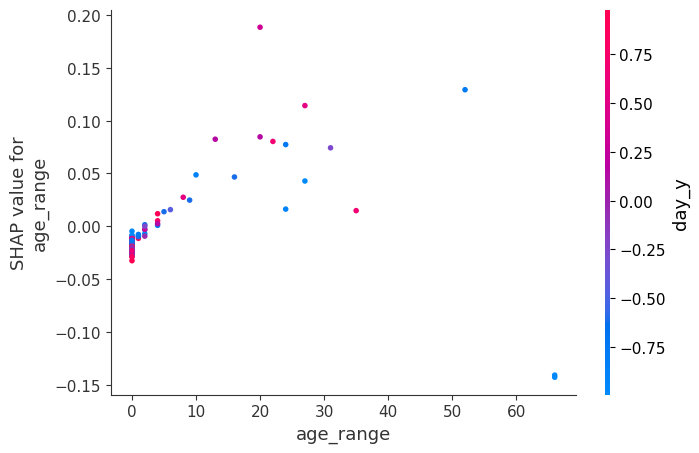

In [ ]:
shap.dependence_plot("age_range", shap_values[Classifiers.SVM.value], indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:])
# poco importante

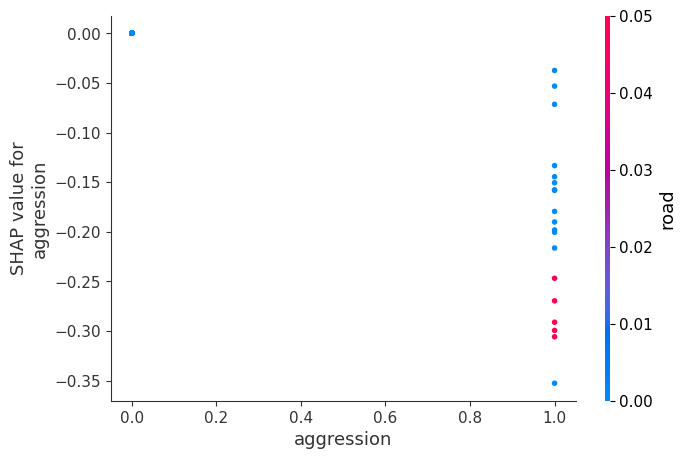

In [ ]:
shap.dependence_plot("aggression", shap_values[Classifiers.SVM.value], indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:])
# poco importante

In [ ]:
#shap.initjs()
force_plot = shap.force_plot(explainers[Classifiers.SVM.value].expected_value, shap_values[Classifiers.SVM.value], indicators_test_db_df_samples[-SVMISTANCESTOCOMPUTE:])
show = show_plot(force_plot)

## K Nearest Neighbors

In [13]:
#f_NC = lambda x: classifiers[Classifiers.NC.value].predict(x)[:,1]
#minmax_scaler = MinMaxScaler().fit(indicators_train_db_df.values) # the explainer remove the feature names
def f_knn(X):
    X = minmax_scaler.transform(X)
    #X = K.constant(X)
    #pred = classifiers[Classifiers.NN.value].model.predict(X).flatten()
    #pred = np.array([round(x) for x in pred])
    return classifiers[Classifiers.KNN.value].predict(X).flatten()

In [ ]:
#np.seterr(divide = 'ignore') # ignore the log10 divizion for 0 warning
explainers[Classifiers.KNN.value] = shap.KernelExplainer(f_knn , indicators_train_db_df_samples.sample(math.ceil(NBASETRAINISTANCES/5), random_state=RANDOM_STATE), seed=RANDOM_STATE) #indicators_train_db_df_samples.sample(10, random_state=RANDOM_STATE), seed=RANDOM_STATE)
shap_values[Classifiers.KNN.value] = explainers[Classifiers.KNN.value].shap_values(indicators_test_db_df_samples)
#np.seterr(divide = 'warn') 

  0%|          | 0/1000 [00:00<?, ?it/s]

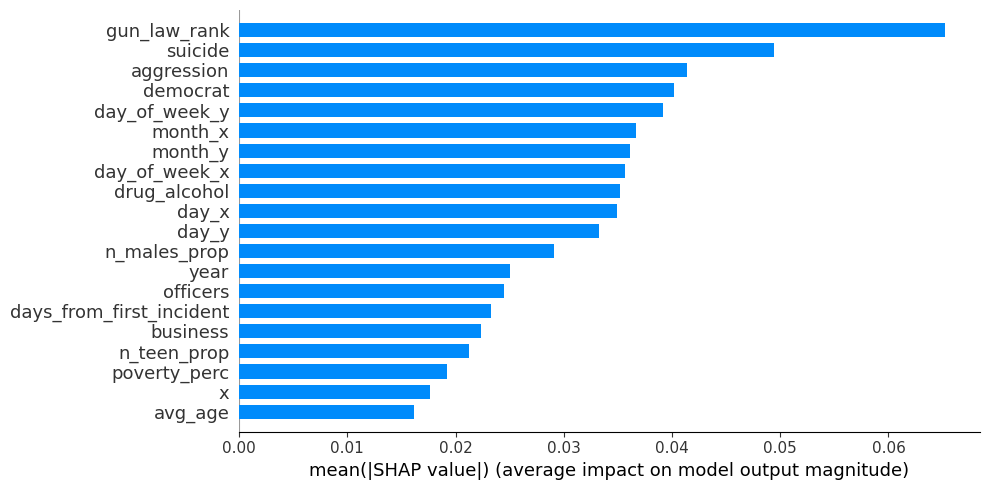

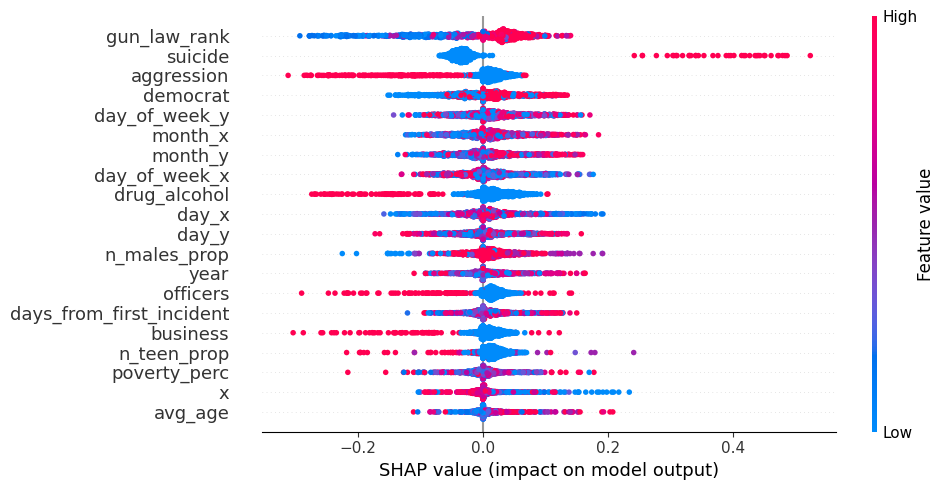

In [ ]:
shap.summary_plot(shap_values[Classifiers.KNN.value], indicators_test_db_df_samples ,plot_size=(10,5), plot_type='bar')
shap.summary_plot(shap_values[Classifiers.KNN.value], indicators_test_db_df_samples ,plot_size=(10,5))
# in classificazione binaria le altezze delle barre sono uguali
# alto abs(shap) => grande importanza

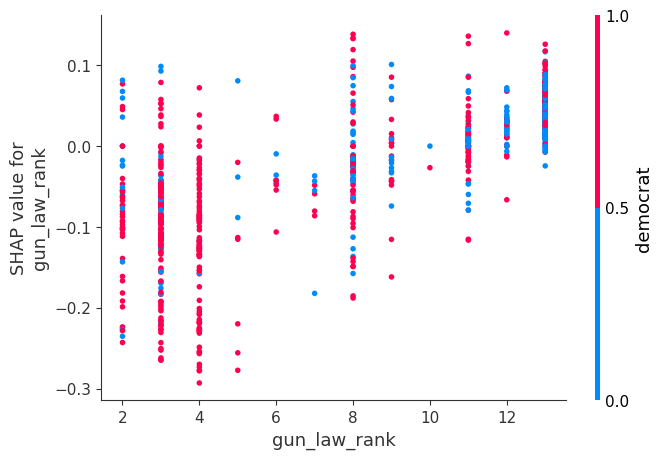

In [ ]:
shap.dependence_plot("gun_law_rank", shap_values[Classifiers.KNN.value], indicators_test_db_df_samples)
# democrat come primo???

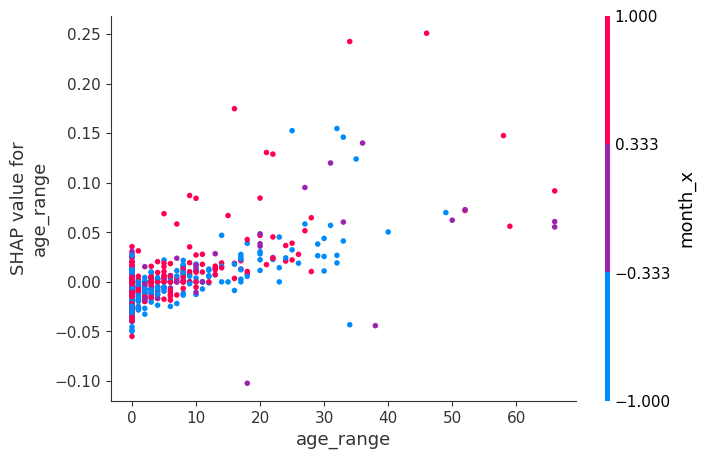

In [ ]:
shap.dependence_plot("age_range", shap_values[Classifiers.KNN.value], indicators_test_db_df_samples)
# incredibilmente puzzolente, sarà per questo che knn va così male?

In [ ]:
#shap.initjs()
force_plot = shap.force_plot(explainers[Classifiers.KNN.value].expected_value, shap_values[Classifiers.KNN.value], indicators_test_db_df_samples)
show = show_plot(force_plot)

# Local explanation

# Attempted suicide

In [14]:
attempted_suicide_index = selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['indexes'].values[0]
attempted_suicide_rb_sample = indicators_test_rb_df.loc[attempted_suicide_index]
attempted_suicide_db_sample = indicators_test_db_df.loc[attempted_suicide_index]

## Decision Tree

calculated probability and label:  1 / 0.970150776522004


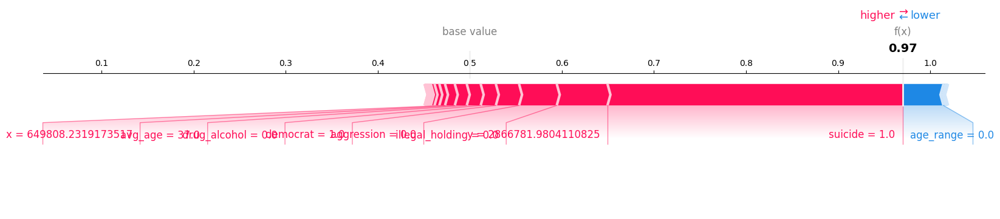

In [ ]:
print('calculated probability and label: ', preds[Classifiers.DT.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]], '/', preds[Classifiers.DT.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]])
shap.force_plot(explainers[Classifiers.DT.value].expected_value[1], 
                shap_values[Classifiers.DT.value][1][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample, 
                matplotlib=matplotlib)

# il valore nero è la probabilità predetta
# base value è the average model output over the training dataset (the value that would be predicted if we did not know any features)
# l'ampiezza delle feature è quanto impattano; le ampiezze più grandi sono collocate al centro
# ovviamente rosso: impatto positivo, blu: impatto negativo

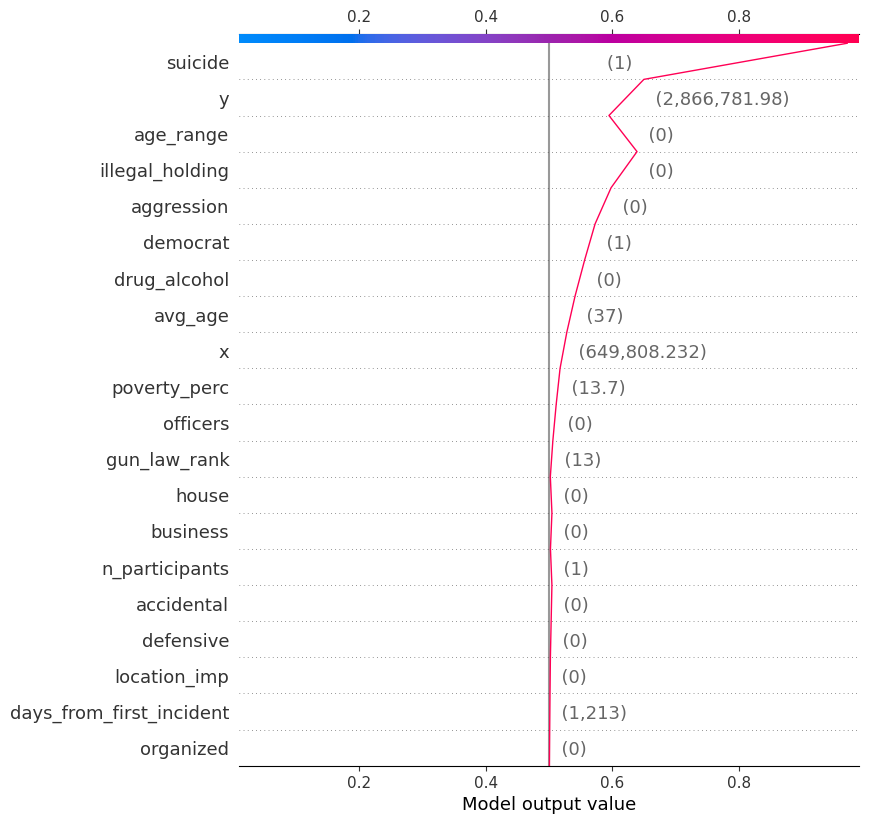

In [ ]:
shap.decision_plot(explainers[Classifiers.DT.value].expected_value[1], 
                shap_values[Classifiers.DT.value][1][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample)
# bello e la predizione non è mai stata incerta (se non per y)

## Random Forest

calculated probability and label:  1 / 0.9410349859643576


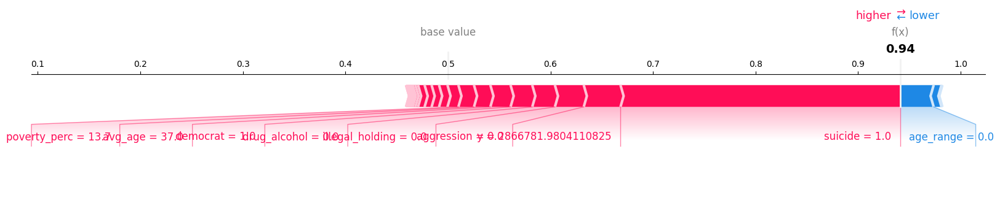

In [ ]:
print('calculated probability and label: ', preds[Classifiers.RF.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]], '/', preds[Classifiers.RF.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]])
shap.force_plot(explainers[Classifiers.RF.value].expected_value[1], 
                shap_values[Classifiers.RF.value][1][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample, 
                matplotlib=matplotlib)

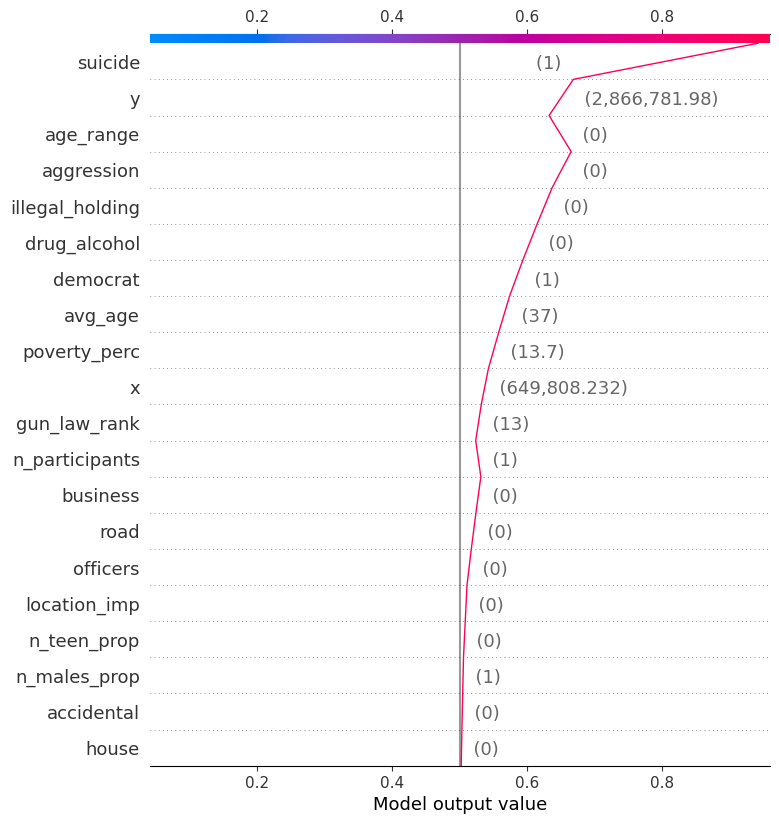

In [ ]:
shap.decision_plot(explainers[Classifiers.RF.value].expected_value[1], 
                shap_values[Classifiers.RF.value][1][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample)
# anche qui, se non per y e n_participants le altre features influiscono tutte in positivo

## Extreme Gradient Boosting

calculated probability and label:  1 / 0.970150776522004


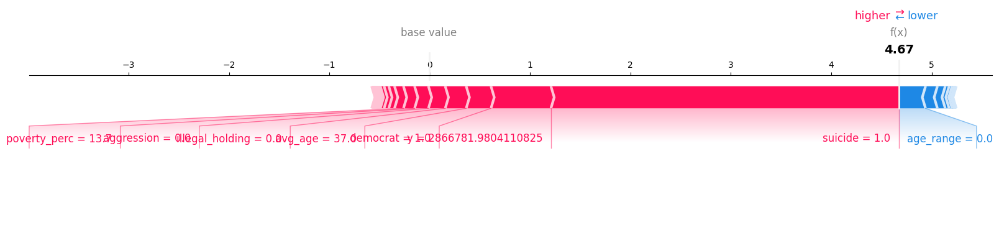

In [ ]:
print('calculated probability and label: ', preds[Classifiers.XGB.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]], '/', preds[Classifiers.DT.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]])
shap.force_plot(explainers[Classifiers.XGB.value].expected_value, 
                shap_values[Classifiers.XGB.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample, 
                matplotlib=matplotlib)

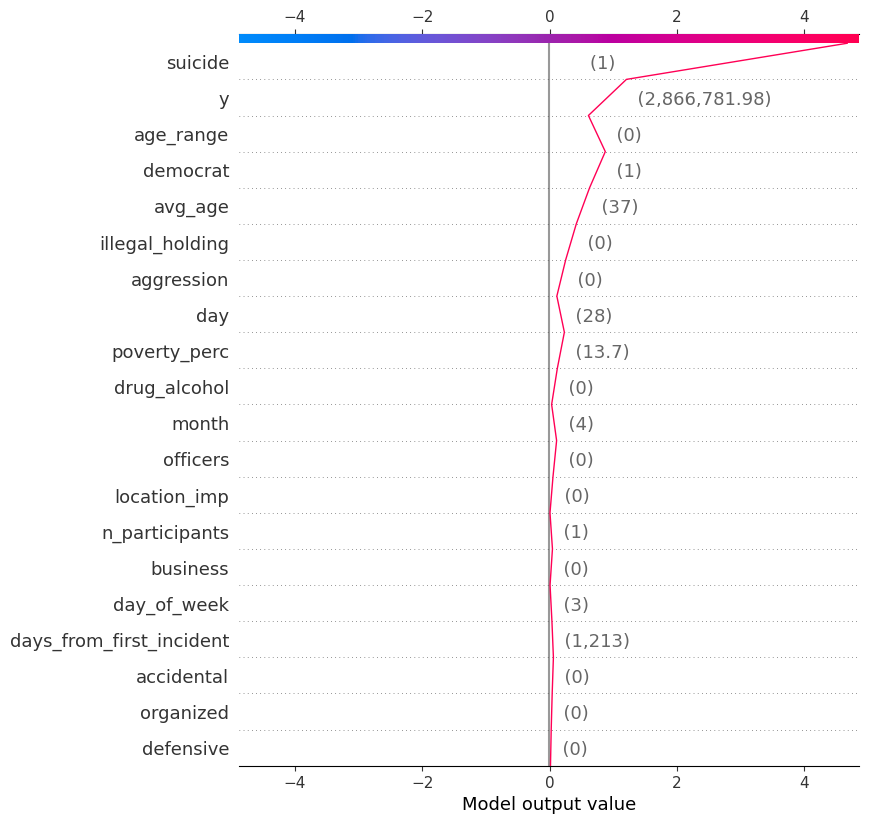

In [ ]:
shap.decision_plot(explainers[Classifiers.XGB.value].expected_value, 
                shap_values[Classifiers.XGB.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_rb_sample)
# predizione meno unilaterale delle precedenti
# non so bene per quale motivo ma qua non abbiamo le probabilità ma una roba che potrebbe corrispondere 
# all'inverso della funzione sigmoi ?!? boh ma fa nulla

## Feed Forward Neural Network

calculated probability and label:  1 / 0.96223235


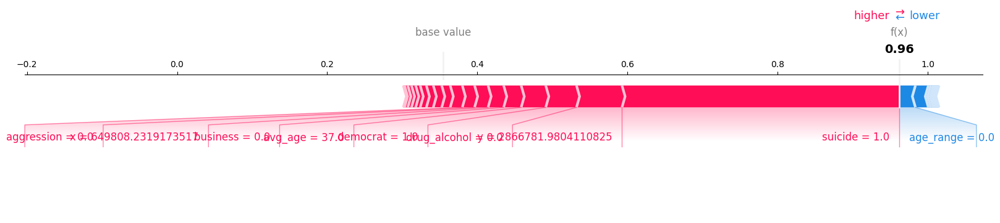

In [ ]:
print('calculated probability and label: ', 
preds[Classifiers.NN.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names'] == 'Attempted Suicide']['positions'].values[0]], 
'/', 
preds[Classifiers.NN.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Attempted Suicide']['positions'].values[0]]
)

shap.force_plot(explainers[Classifiers.NN.value].expected_value, 
                shap_values[Classifiers.NN.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_db_sample, 
                matplotlib=matplotlib)

# notare il bias dell'output unit nella rete neurale che mette il base value a 0.3 circa!!

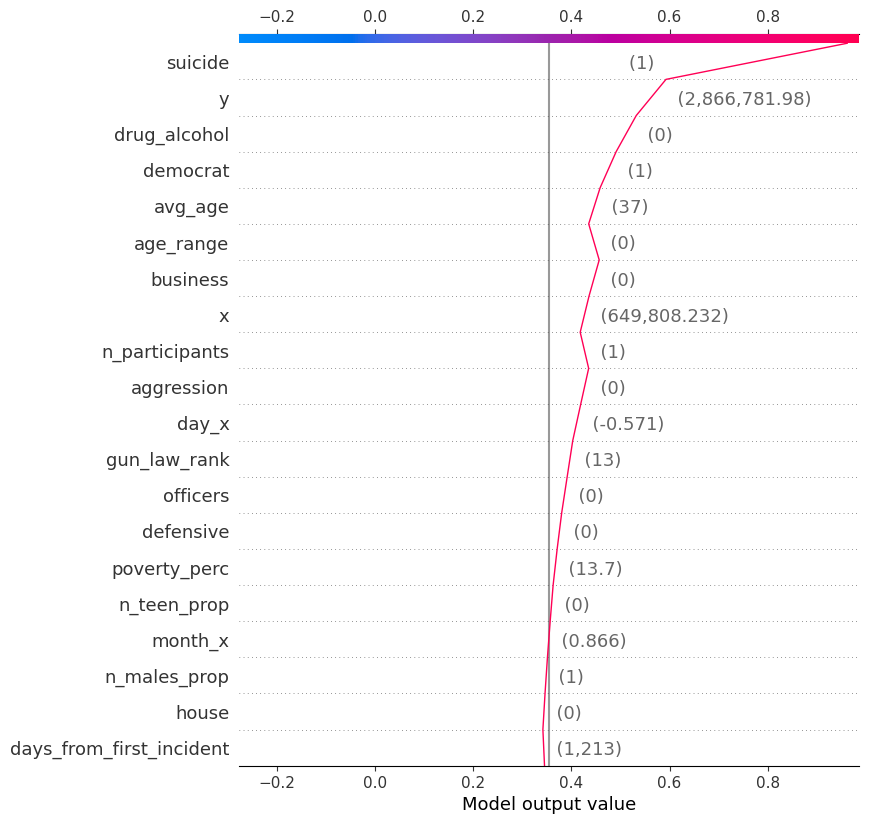

In [ ]:
shap.decision_plot(explainers[Classifiers.NN.value].expected_value, 
                shap_values[Classifiers.NN.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_db_sample)
# poco da dire, uguale a sopra

## K Nearest Neighbors

calculated label:  1


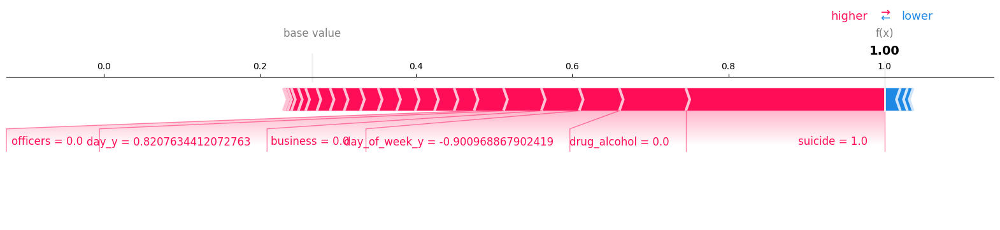

In [ ]:
print('calculated label: ', 
preds[Classifiers.KNN.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names'] == 'Attempted Suicide']['positions'].values[0]], 
)

shap.force_plot(explainers[Classifiers.KNN.value].expected_value, 
                shap_values[Classifiers.KNN.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_db_sample, 
                matplotlib=matplotlib)

# anche qui l'expected value non è 0 o 0.5

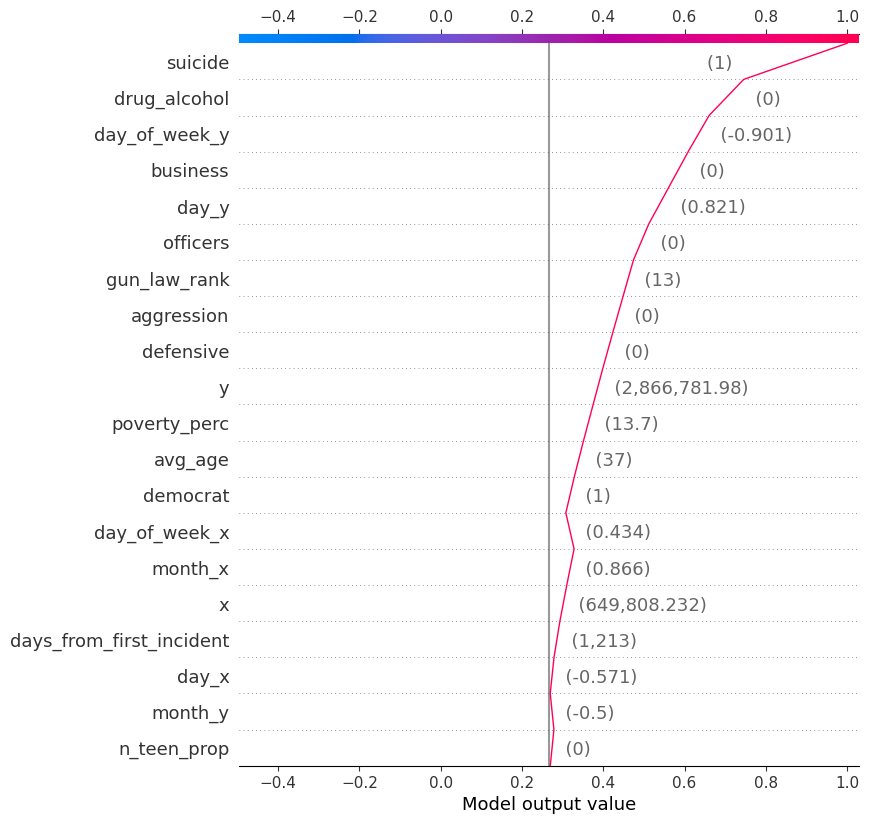

In [ ]:
shap.decision_plot(explainers[Classifiers.KNN.value].expected_value, 
                shap_values[Classifiers.KNN.value][ATTEMPTED_SUICIDE_OFFSET], 
                attempted_suicide_db_sample)

# anche il knn ha sbagliato la predizione, come tutti
# riflessione -> essendo un caso così unico nel dataset, è impossibile predirre correttamente la label
# senza conoscenze aggiuntive o esterne (come anche solo il concetto di suicidio non riuscito)

In [ ]:
'''hyperplane_dists = classifiers[Classifiers.SVM.value].decision_function(
    X=pd.concat([
        indicators_test_db_df.iloc[attempted_suicide_pos].to_frame().T.reset_index(),
        indicators_train_db_df.iloc[indeces[0]].reset_index() # neighbors (could be both mortal or not)
    ]).drop(columns=['index'])
)
probas = classifiers[Classifiers.SVM.value].predict_proba(
    X=pd.concat([
        indicators_test_db_df.iloc[attempted_suicide_pos].to_frame().T.reset_index(),
        indicators_train_db_df.iloc[indeces[0]].reset_index() # neighbors (could be both mortal or not)
    ]).drop(columns=['index'])
)
dist_probs = {
    'distance_from_hyperplane': hyperplane_dists,
    'fatal_probability': probas[:,1]
}
pd.DataFrame(dist_probs)'''

"hyperplane_dists = classifiers[Classifiers.SVM.value].decision_function(\n    X=pd.concat([\n        indicators_test_db_df.iloc[attempted_suicide_pos].to_frame().T.reset_index(),\n        indicators_train_db_df.iloc[indeces[0]].reset_index() # neighbors (could be both mortal or not)\n    ]).drop(columns=['index'])\n)\nprobas = classifiers[Classifiers.SVM.value].predict_proba(\n    X=pd.concat([\n        indicators_test_db_df.iloc[attempted_suicide_pos].to_frame().T.reset_index(),\n        indicators_train_db_df.iloc[indeces[0]].reset_index() # neighbors (could be both mortal or not)\n    ]).drop(columns=['index'])\n)\ndist_probs = {\n    'distance_from_hyperplane': hyperplane_dists,\n    'fatal_probability': probas[:,1]\n}\npd.DataFrame(dist_probs)"

# Mass Shooting

In [15]:
mass_shooting_index = selected_records_to_explain_df[selected_records_to_explain_df['instance names'] == 'Mass shooting']['indexes'].values[0]
mass_shooting_rb_sample = indicators_test_rb_df.loc[mass_shooting_index]
mass_shooting_db_sample = indicators_test_db_df.loc[mass_shooting_index]

## Decision Tree

calculated probability and label:  1 / 0.9835333524494504


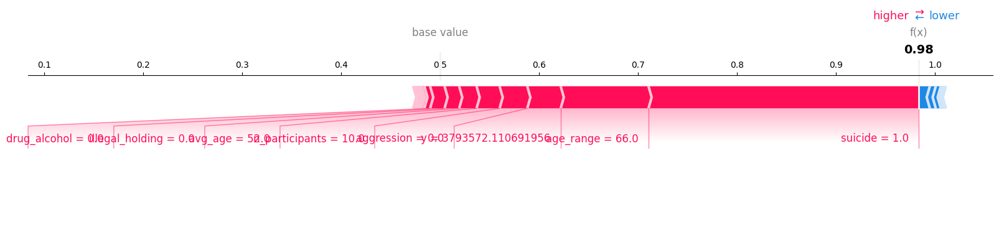

In [ ]:
print('calculated probability and label: ', 
      preds[Classifiers.DT.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]], 
      '/', 
      preds[Classifiers.DT.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]],
      )

shap.force_plot(explainers[Classifiers.DT.value].expected_value[1], 
                shap_values[Classifiers.DT.value][1][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample, 
                matplotlib=matplotlib)

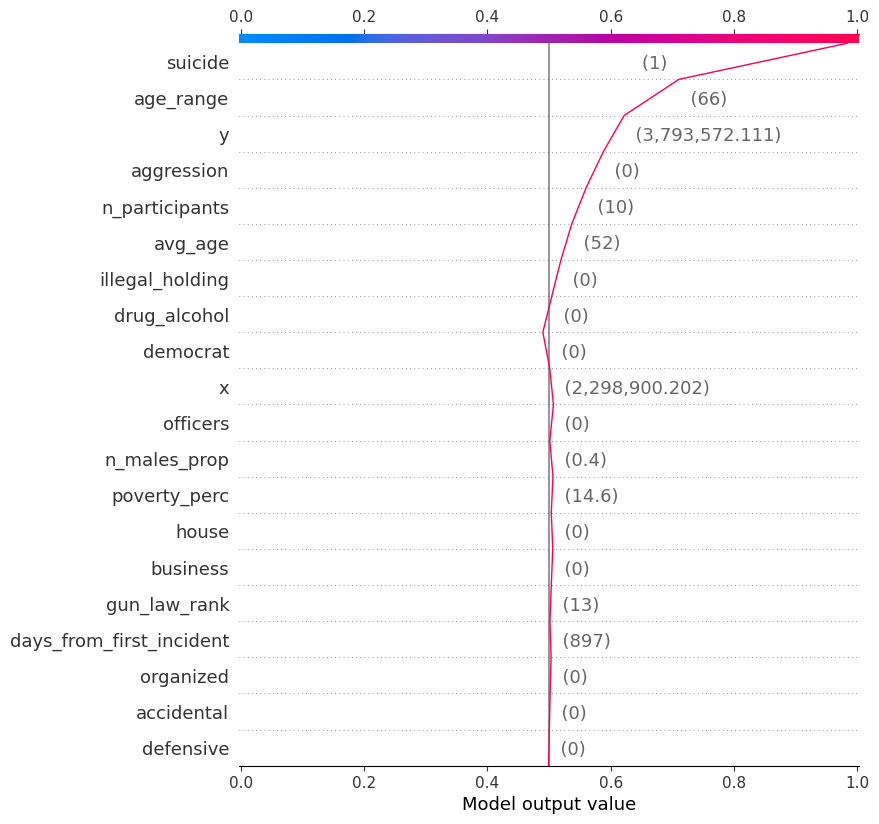

In [ ]:
shap.decision_plot(explainers[Classifiers.DT.value].expected_value[1], 
                shap_values[Classifiers.DT.value][1][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample)
# qui il suicidio persa molto assieme all'age_range, inoltre n_participants pesa molto, insolitamente
# in quanto undicesima features in per influenza, ora quinta....

## Random Forest

calculated probability and label:  1 / 0.9646964943671178


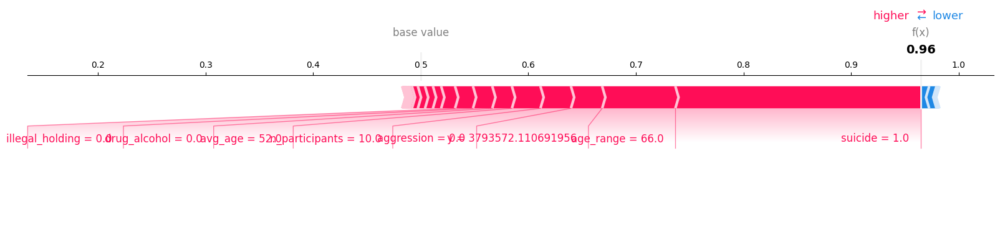

In [ ]:
print('calculated probability and label: ', 
      preds[Classifiers.RF.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]], 
      '/', 
      preds[Classifiers.RF.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]],
      )

shap.force_plot(explainers[Classifiers.RF.value].expected_value[1], 
                shap_values[Classifiers.RF.value][1][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample, 
                matplotlib=matplotlib)

calculated probability and label:  1 / 0.9646964943671178


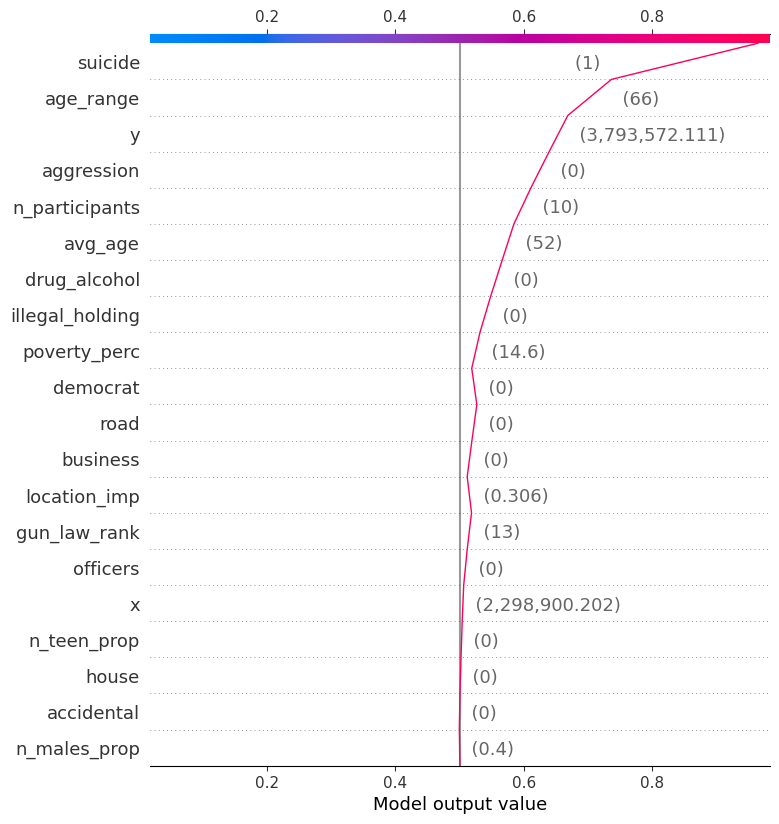

In [ ]:
print('calculated probability and label: ', 
      preds[Classifiers.RF.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]], 
      '/', 
      preds[Classifiers.RF.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]],
      )
shap.decision_plot(explainers[Classifiers.RF.value].expected_value[1], 
                shap_values[Classifiers.RF.value][1][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample)

# discorso simile al precedente

## Extreme Gradient Boosting

calculated probability and label:  1 / 0.9624702


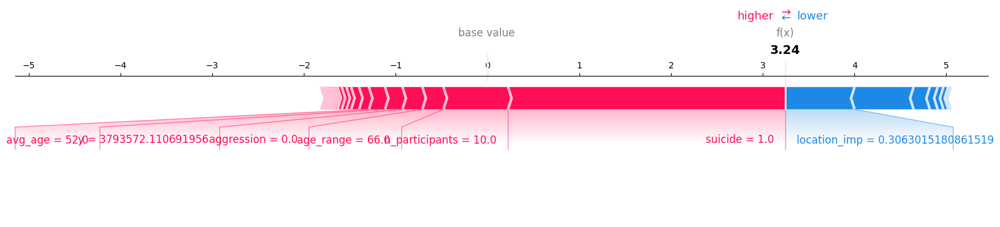

In [ ]:
print('calculated probability and label: ', 
      preds[Classifiers.XGB.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]], 
      '/', 
      preds[Classifiers.XGB.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]],
      )

shap.force_plot(explainers[Classifiers.XGB.value].expected_value, 
                shap_values[Classifiers.XGB.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample, 
                matplotlib=matplotlib)

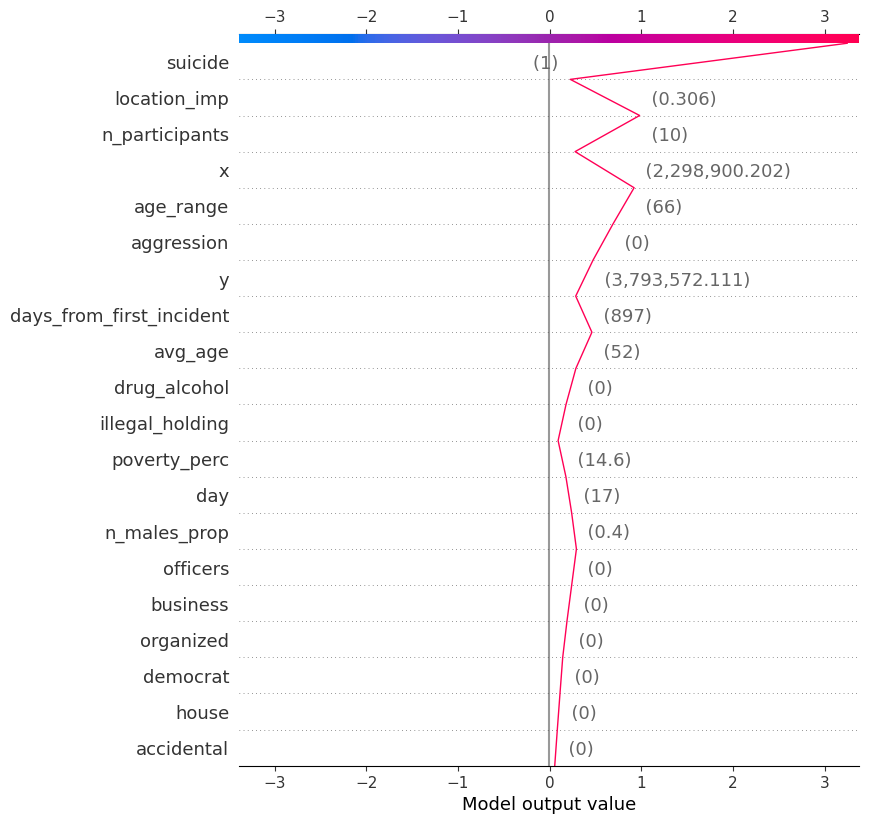

In [ ]:
shap.decision_plot(explainers[Classifiers.XGB.value].expected_value, 
                shap_values[Classifiers.XGB.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_rb_sample)
# molto interessante che la valutazione è 3.24 (meno del tentato suicidio), non così alta
# inoltre location_imp è stranamente alta essendo una delle features in media meno importanti e pesa negativamente nell'esito, interessante
# n_participants pesa molto più del solito (correttamente ?!?)

## Feed Forward Neural Network

calculated probability and label:  1 / 0.99854696


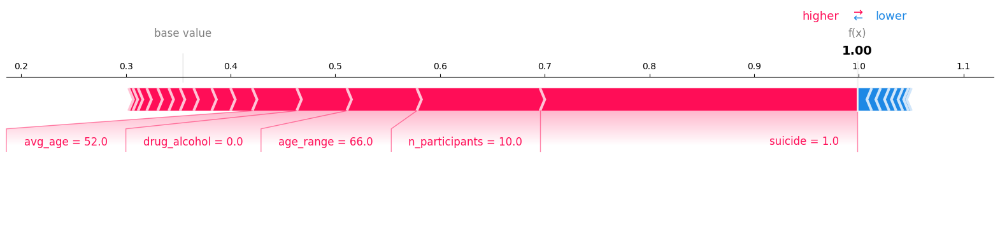

In [ ]:
print('calculated probability and label: ', 
preds[Classifiers.NN.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names'] == 'Mass shooting']['positions'].values[0]], 
'/', 
preds[Classifiers.NN.value]['probs'][selected_records_to_explain_df[selected_records_to_explain_df['instance names']=='Mass shooting']['positions'].values[0]]
)

shap.force_plot(explainers[Classifiers.NN.value].expected_value, 
                shap_values[Classifiers.NN.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_db_sample, 
                matplotlib=matplotlib)

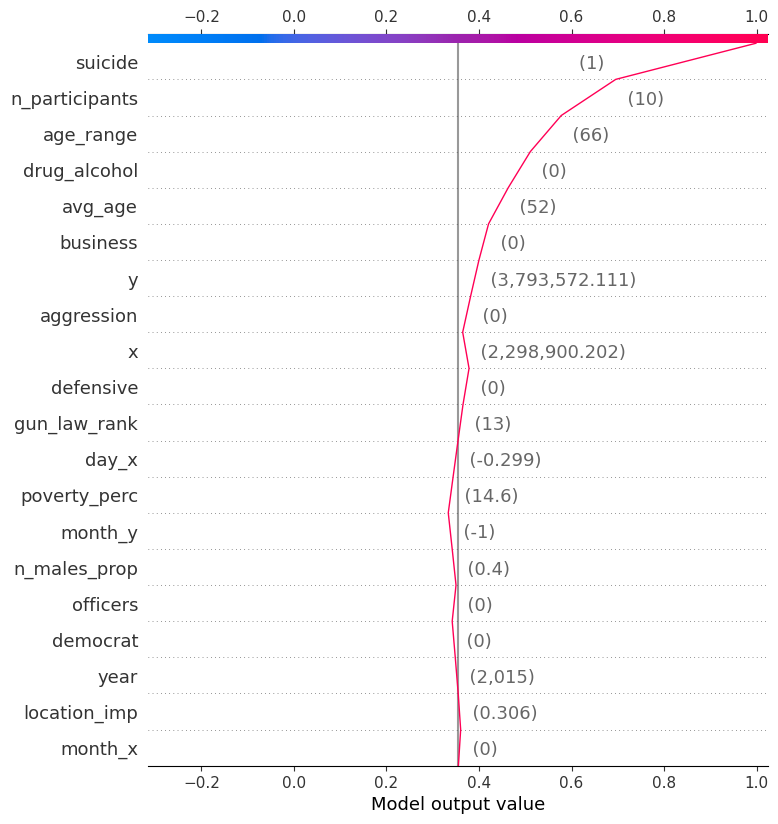

In [ ]:
shap.decision_plot(explainers[Classifiers.NN.value].expected_value, 
                shap_values[Classifiers.NN.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_db_sample)
# qua esito classificatione con probabilità praticamente 1, tutte le features più importanti guidano
# correttamente la classificazione

## K Nearest Neighbors

calculated label:  1


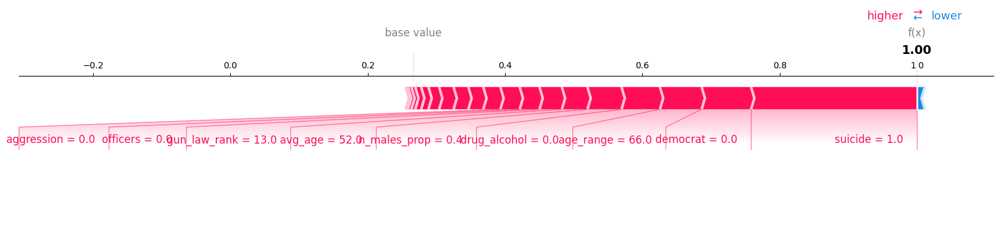

In [ ]:
print('calculated label: ', 
preds[Classifiers.NN.value]['labels'][selected_records_to_explain_df[selected_records_to_explain_df['instance names'] == 'Mass shooting']['positions'].values[0]], 
)

shap.force_plot(explainers[Classifiers.KNN.value].expected_value, 
                shap_values[Classifiers.KNN.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_db_sample, 
                matplotlib=matplotlib)

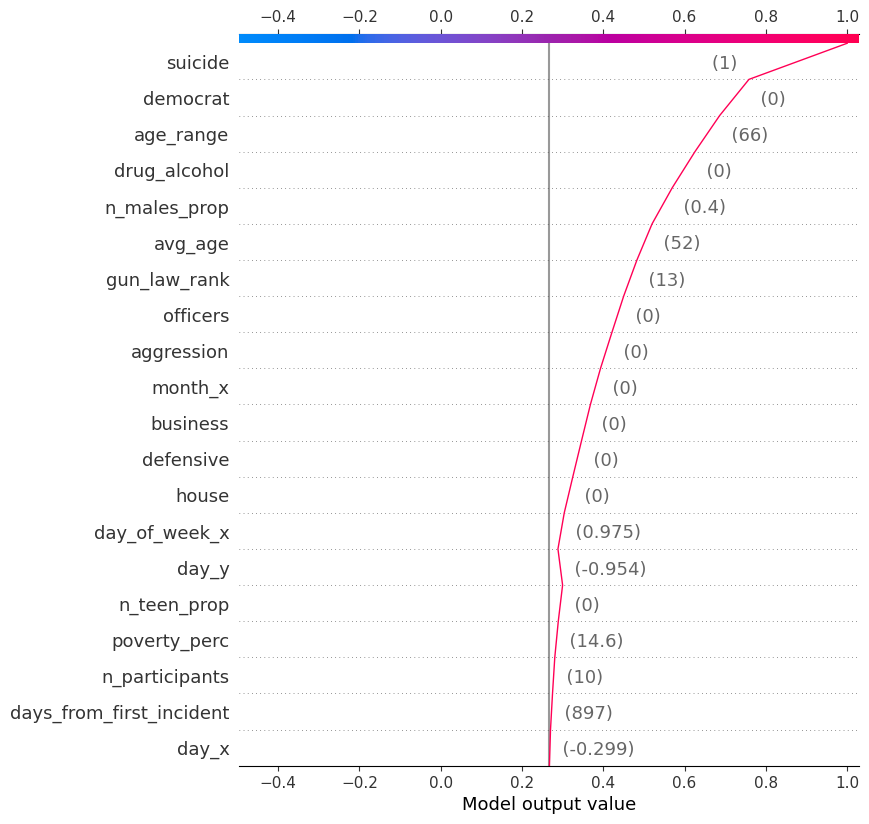

In [ ]:
shap.decision_plot(explainers[Classifiers.KNN.value].expected_value, 
                shap_values[Classifiers.KNN.value][MASS_SHOOTING_OFFSET], 
                mass_shooting_db_sample)

# Evaluation

In [16]:
# load the already computed default values for features
feature_default_db = pd.read_csv('../data/classification_results/db_default_features.csv').to_numpy()[0]
feature_default_rb = pd.read_csv('../data/classification_results/rb_default_features.csv').to_numpy()[0]

In [17]:
clf_names = [Classifiers.DT.value, Classifiers.RF.value, Classifiers.SVM.value, Classifiers.XGB.value, Classifiers.NN.value]

In [18]:
positions_to_explain = selected_records_to_explain_df['positions'].to_list()
instance_names_to_explain = selected_records_to_explain_df['instance names'].to_list()
true_labels_to_explain = selected_records_to_explain_df['true labels'].to_list()

In [19]:
metrics_selected_records = []
for clf_name in clf_names:
    classifier = classifiers[clf_name]
    if clf_name in rb_clf_names:
        feature_defaults = feature_default_rb
        instances = indicators_test_rb_df.iloc[positions_to_explain].values
    else:
        feature_defaults = feature_default_db
        instances = indicators_normalized_test_db_df.iloc[positions_to_explain].values

    clf_metrics = {}
    for i in range(instances.shape[0]):
        prediction = preds[clf_name]['probs'].iloc[positions_to_explain] #classifier.predict(instances[i].reshape(1,-1))[0]

        if clf_name == Classifiers.DT.value or clf_name == Classifiers.RF.value:
            feature_importances = shap_values[clf_name][1][ATTEMPTED_SUICIDE_OFFSET + i]
        else:
            feature_importances = shap_values[clf_name][ATTEMPTED_SUICIDE_OFFSET + i]

        sample_metric = evaluate_explanation(classifier, instances[i], feature_importances, feature_defaults)
        clf_metrics[instance_names_to_explain[i]] = sample_metric

    clf_metrics_df = pd.DataFrame(clf_metrics).T
    clf_metrics_df.columns = pd.MultiIndex.from_product([clf_metrics_df.columns, [clf_name]])
    metrics_selected_records.append(clf_metrics_df)

metrics_selected_records_df = metrics_selected_records[0].join(metrics_selected_records[1:]).sort_index(level=0, axis=1)
metrics_selected_records_df['True Label'] = true_labels_to_explain

# save faithfulness
faithfulness_df = metrics_selected_records_df[['faithfulness']]
faithfulness_df.columns = faithfulness_df.columns.droplevel()
faithfulness_df.to_csv('../data/explanation_results/shap_faithfulness_selected_records.csv')

# save monotonity
monotonity_df = metrics_selected_records_df[['monotonicity']]
monotonity_df.columns = monotonity_df.columns.droplevel()
monotonity_df.to_csv('../data/explanation_results/shap_monotonicity_selected_records.csv')

metrics_selected_records_df

1/1 [==============================] - 0s 20ms/step


faithfulness  \
                                                                       DecisionTreeClassifier   
Attempted Suicide                                                                    0.963508   
Mass shooting                                                                        0.977253   
Fatal with highest confidence by DecisionTreeClassifier                              0.762704   
Fatal with highest confidence by NeuralNetworkClassifier                             0.977253   
Fatal with highest confidence by RandomForestClassifier                              0.980199   
Fatal with highest confidence by NaiveBayesMixedClassifier                           0.978704   
Fatal with highest confidence by SupportVectorMachineClassifier                      0.349155   
Fatal with highest confidence by TabNetClassifier                                    0.823683   
Fatal with highest confidence by ExtremeGradientBoostingClassifier                   0.966861   
Non-Fatal with highest confidence by DecisionTreeClassifier                         -0.929084   
Non-Fatal with highest confidence by NeuralNetworkClassifier                        -0.711646   
Non-Fatal with highest confidence by RandomForestClassifier                          -0.79406   
Non-Fatal with highest confidence by NaiveBayesMixedClassifier                      -0.467325   
Non-Fatal with highest confidence by SupportVectorMachineClassifier                 -0.840387   
Non-Fatal with highest confidence by TabNetClassifier                                0.694946   
Non-Fatal with highest confidence by ExtremeGradientBoostingClassifier                0.69763   

                                                                                                          \
                                                                       ExtremeGradientBoostingClassifier   
Attempted Suicide                                                                               0.979389   
Mass shooting                                                                                   0.918252   
Fatal with highest confidence by DecisionTreeClassifier                                        -0.558125   
Fatal with highest confidence by NeuralNetworkClassifier                                        0.918252   
Fatal with highest confidence by RandomForestClassifier                                          0.96475   
Fatal with highest confidence by NaiveBayesMixedClassifier                                     -0.730238   
Fatal with highest confidence by SupportVectorMachineClassifier                                 0.779718   
Fatal with highest confidence by TabNetClassifier                                               0.842501   
Fatal with highest confidence by ExtremeGradientBoostingClassifier                              0.953075   
Non-Fatal with highest confidence by DecisionTreeClassifier                                    -0.965275   
Non-Fatal with highest confidence by NeuralNetworkClassifier                                   -0.908356   
Non-Fatal with highest confidence by RandomForestClassifier                                     -0.95582   
Non-Fatal with highest confidence by NaiveBayesMixedClassifier                                 -0.592617   
Non-Fatal with highest confidence by SupportVectorMachineClassifier                             -0.85363   
Non-Fatal with highest confidence by TabNetClassifier                                          -0.685433   
Non-Fatal with highest confidence by ExtremeGradientBoostingClassifier                         -0.887615   

                                                                                                \
                                                                       NeuralNetworkClassifier   
Attempted Suicide                                                                     0.130451   
Mass shooting                                                                          -0.0372 

In [20]:

positions_to_explain = random_records_to_explain_df['positions'].to_list()
true_labels_to_explain = random_records_to_explain_df['true labels'].to_list()

metrics_random_records = {}
for clf_name in clf_names:
    classifier = classifiers[clf_name]
    if clf_name in rb_clf_names:
        feature_defaults = feature_default_rb
        instances = indicators_test_rb_df.iloc[positions_to_explain].values
    else:
        feature_defaults = feature_default_db
        instances = indicators_normalized_test_db_df.iloc[positions_to_explain].values

    faithfulness = []
    for i in range(instances.shape[0]):
        #prediction = classifier.predict(instances[i].reshape(1,-1))[0]
        prediction = preds[clf_name]['probs'].iloc[positions_to_explain]
        
        if clf_name == Classifiers.DT.value or clf_name == Classifiers.RF.value:
            feature_importances = shap_values[clf_name][1][RANDOM_RECORDS_OFFSET + i]
        else:
            feature_importances = shap_values[clf_name][RANDOM_RECORDS_OFFSET + i]

        sample_metric = evaluate_explanation(classifier, instances[i], feature_importances, feature_defaults)
        faithfulness.append(sample_metric['faithfulness'])
    
    metrics_random_records[clf_name] = {}
    metrics_random_records[clf_name]['mean faithfulness'] = np.nanmean(faithfulness)
    metrics_random_records[clf_name]['std faithfulness'] = np.nanstd(faithfulness)

metrics_random_records_df = pd.DataFrame(metrics_random_records)
metrics_random_records_df.to_csv('../data/explanation_results/shap_metrics_random_records.csv')
metrics_random_records_df

1/1 [==============================] - 0s 21ms/step


,DecisionTreeClassifier,RandomForestClassifier,SupportVectorMachineClassifier,ExtremeGradientBoostingClassifier,NeuralNetworkClassifier
mean faithfulness,-0.263450,-0.293849,-0.138946,-0.319465,-0.039935
std faithfulness,0.638129,0.711163,0.165030,0.699578,0.200060
